In [145]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import hdf5plugin
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import sys
import os
import dill

In [146]:
onh = sc.read_h5ad("/Users/cristalvillalba/Downloads/signac/onh_annotate.h5ad")

In [147]:
onh

AnnData object with n_obs × n_vars = 300097 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

In [ ]:
sc.pl.dotplot(onh, marker_genes_dict, "leiden", dendrogram=True)

In [19]:
sc.pp.neighbors(onh)

         Falling back to preprocessing with `sc.pp.pca` and default params.


In [6]:
sc.tl.umap(onh)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


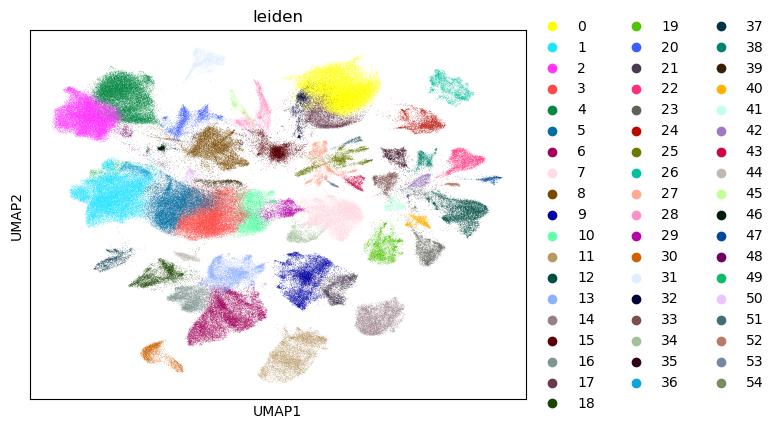

In [17]:
sc.pl.umap(onh, color = "leiden")

In [24]:
onh.obs["annotate"]

onhMMD_23_4840_ONH_AAACCCAAGCTCCACG-1     Oligodendrocyte MBP+
onhMMD_23_4840_ONH_AAACCCAAGGTCCAGA-1     Oligodendrocyte MBP+
onhMMD_23_4840_ONH_AAACCCAAGGTGCAGT-1     Oligodendrocyte MBP+
onhMMD_23_4840_ONH_AAACCCAAGTCTAGAA-1                  Schwann
onhMMD_23_4840_ONH_AAACCCAAGTTCCATG-1     Vascular Endothelial
                                                  ...         
onh23_0574_ONH_bead_TTTGGTTAGTTTGAGA-1                  B Cell
onh23_0574_ONH_bead_TTTGGTTGTTGCATAC-1         Astrocyte GFAP+
onh23_0574_ONH_bead_TTTGGTTTCCATCTCG-1           Photoreceptor
onh23_0574_ONH_bead_TTTGTTGAGGGCGAGA-1                     RPE
onh23_0574_ONH_bead_TTTGTTGGTACCATAC-1              Fibroblast
Name: annotate, Length: 300097, dtype: category
Categories (18, object): ['Amacrine', 'Astrocyte', 'Astrocyte GFAP+', 'B Cell', ..., 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial']

In [26]:
onh

AnnData object with n_obs × n_vars = 300097 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


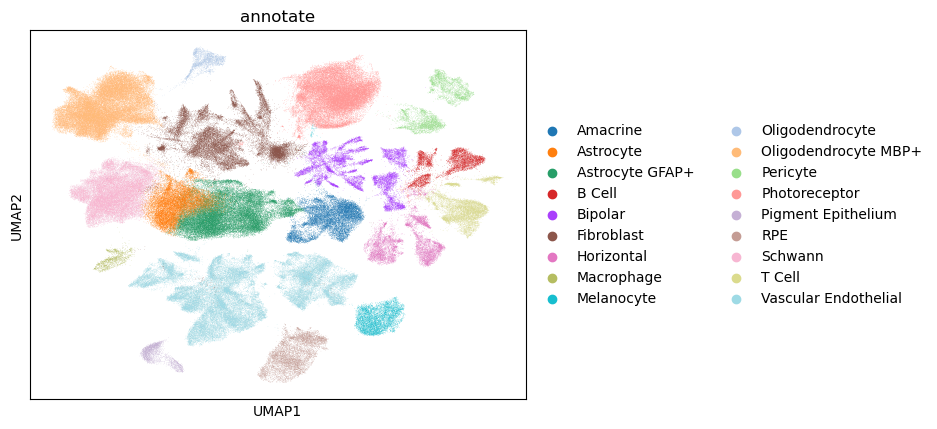

In [25]:
sc.pl.umap(onh, color = "annotate")

In [332]:
onh_astro=onh[~onh.obs['annotate'].isin(['Amacrine','B Cell', 'Bipolar', 'Fibroblast', 'Horizontal', 'Macrophage', 'Melanocyte', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]

In [333]:
onh_astro

View of AnnData object with n_obs × n_vars = 49119 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


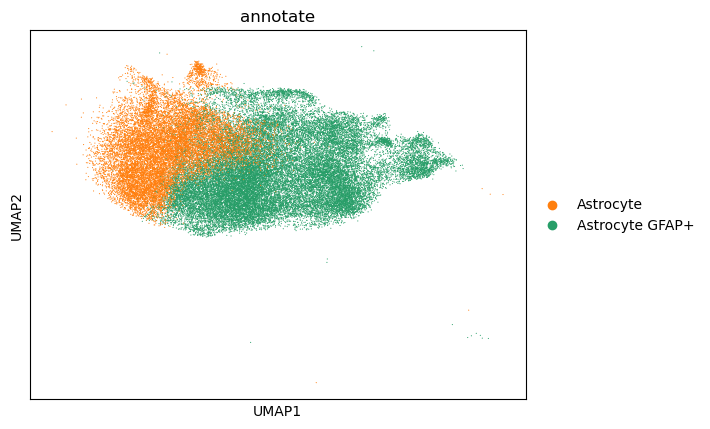

In [334]:
sc.pl.umap(onh_astro, color=["annotate"])

In [336]:
#Redo clustering from onh_bcell
# Normalizing to median total counts
sc.pp.normalize_total(onh_astro)
# Logarithmize the data
sc.pp.log1p(onh_astro)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [338]:
sc.pp.highly_variable_genes(onh_astro, n_top_genes=2000, batch_key="sampleid")

ZeroDivisionError: division by zero

In [339]:
sc.pl.highly_variable_genes(onh_astro)

KeyError: 'hvg'

In [340]:
sc.tl.pca(onh_astro)

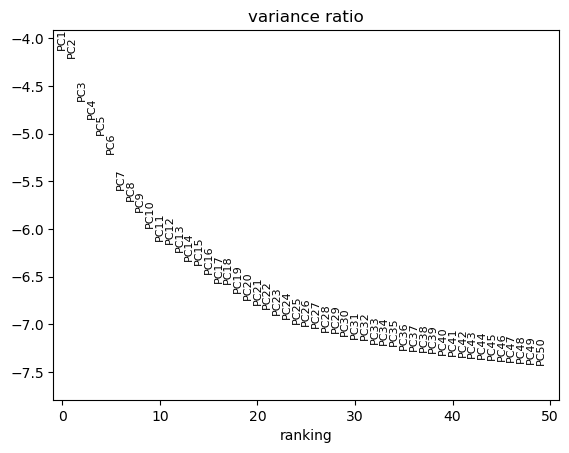

In [341]:
sc.pl.pca_variance_ratio(onh_astro, n_pcs=50, log=True)

In [342]:
sc.pp.neighbors(onh_astro)

In [ ]:
sc.tl.umap(onh_astro)

In [347]:
for res in [0.04, 0.05, 0.1]:
    sc.tl.leiden(
        onh_astro, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


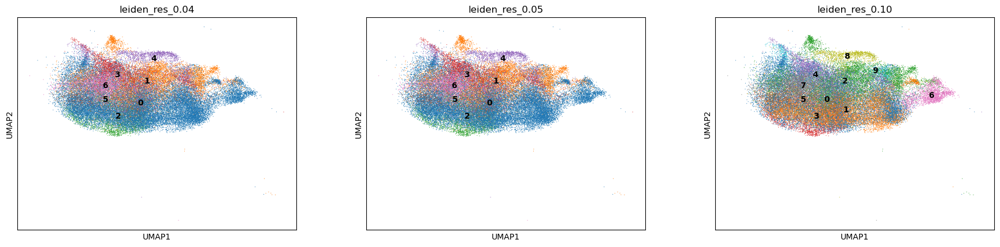

In [348]:
sc.pl.umap(
    onh_astro,
    color=["leiden_res_0.04", "leiden_res_0.05", "leiden_res_0.10"],
    legend_loc="on data",
)

In [349]:
#### Identification of clusters based on known marker genes for astrocytes
 
marker_genes_dict = {
    "Astrocyte GFAP+": ["GFAP", "SOX9", "DIO2", "SLCO1C1"],
    "General Astrocytes": ["ABHD5", "ALDH1L1", "CPT1A", "CPT2", "GPT2", "PC"],
    "Mature astrocytes": ["CNN1", "FMN2", "GJB6", "ITGA6", "NEBL", "PDLIM7", "SYNPO2"],
    "Astrocytes endfeet": ["APOE", "AQP4","GJA1"],
    "Fine Astrocyte Processes": ["EZR", "RDX", "SLC1A2", "SLC1A3"],
    "Immature astrocytes": ["THBS1", "SYNM", "NES", "ITGB5", "SYNM", "THBS1", "VIM"],
}

categories: 0, 1, 2, etc.
var_group_labels: Astrocyte GFAP+, General Astrocytes, Mature astrocytes, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


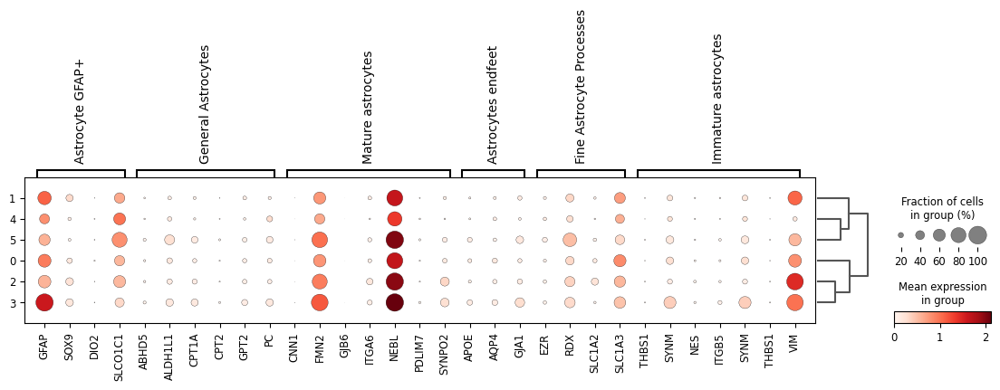

In [353]:
sc.pl.dotplot(onh_astro, marker_genes_dict, "leiden_res_0.03", dendrogram=True)

In [354]:
onh_astro.obs["cell_type"] = onh_astro.obs["leiden_res_0.03"].map(
    {
        "0": "Mature astrocytes",
        "1": "Astrocyte GFAP+",
        "2": "Mature astrocytes",
        "3": "Astrocyte GFAP+",
        "4": "Mature astrocytes",
        "5": "Mature astrocytes",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


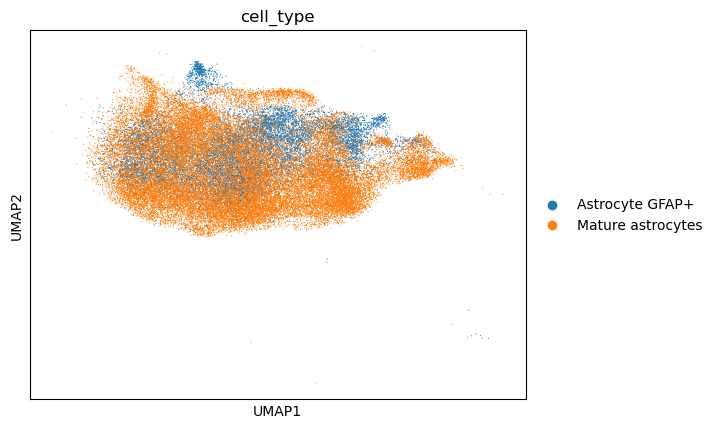

In [355]:
sc.pl.umap(onh_astro, color=["cell_type"])

In [356]:
sc.write('onh_astrocytes.h5ad', onh_astro)

In [ ]:
### B cells

In [30]:
##To exclude clusters we want to remove from h5ad
onh_bcell=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'Fibroblast', 'Horizontal', 'Macrophage', 'Melanocyte', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]

In [31]:
onh_bcell

View of AnnData object with n_obs × n_vars = 6307 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


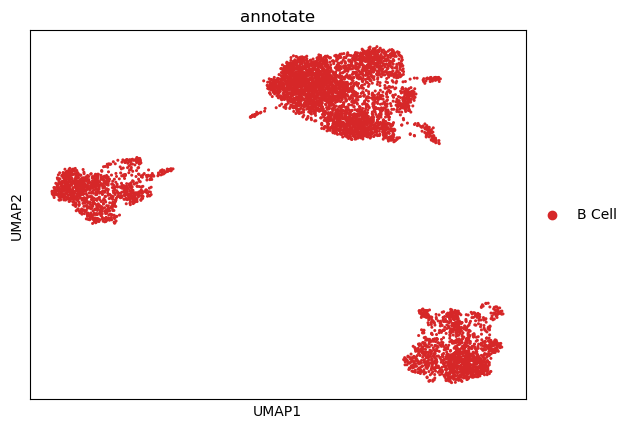

In [335]:
sc.pl.umap(onh_bcell, color=["annotate"])

In [36]:
#Redo clustering from onh_bcell
# Normalizing to median total counts
sc.pp.normalize_total(onh_bcell)
# Logarithmize the data
sc.pp.log1p(onh_bcell)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [37]:
sc.pp.highly_variable_genes(onh_bcell, n_top_genes=2000, batch_key="sampleid")

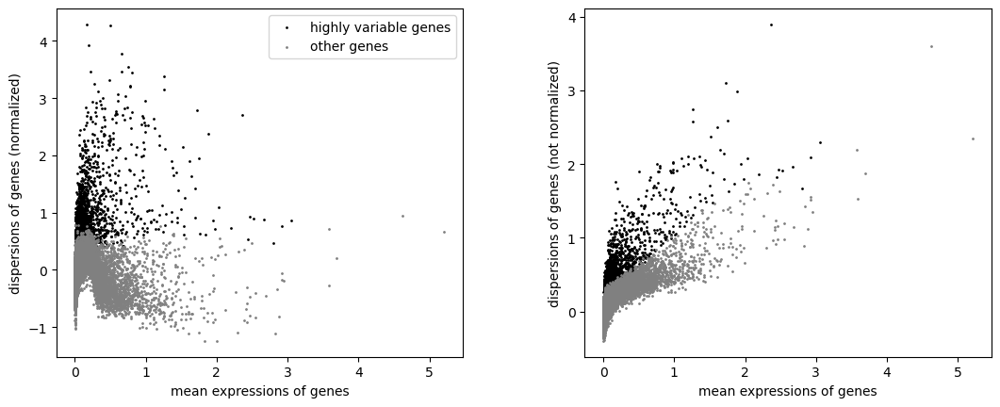

In [38]:
sc.pl.highly_variable_genes(onh_bcell)

In [39]:
sc.tl.pca(onh_bcell)

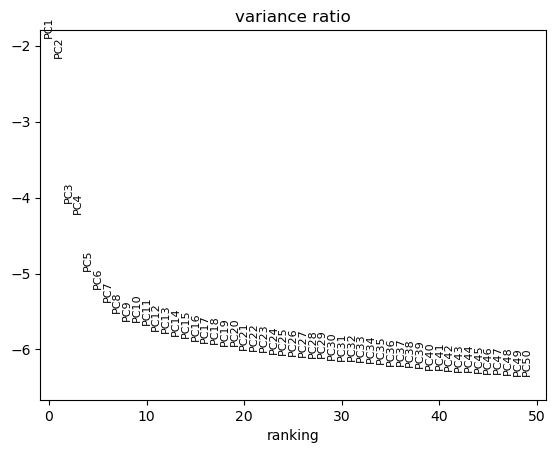

In [40]:
sc.pl.pca_variance_ratio(onh_bcell, n_pcs=50, log=True)

In [41]:
sc.pp.neighbors(onh_bcell)

In [47]:
sc.tl.umap(onh_bcell)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


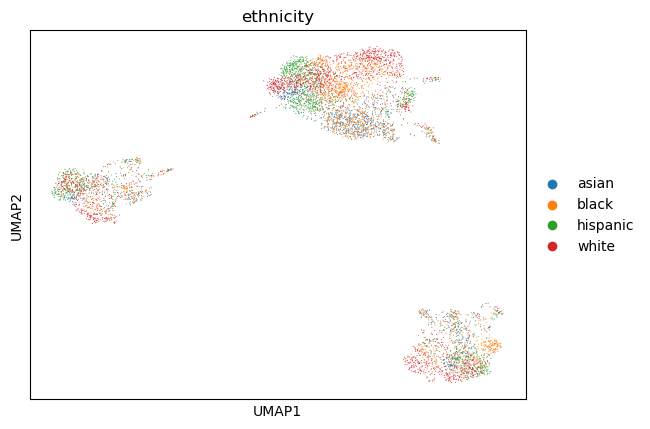

In [46]:
sc.pl.umap(
    onh_bcell,
    color="ethnicity",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

In [48]:
# Using the igraph implementation and a fixed number of iterations can be significantly faster, especially for larger datasets
sc.tl.leiden(onh_bcell, flavor="igraph", n_iterations=2)

AnnData object with n_obs × n_vars = 6307 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotate_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'gender_colors', 'ethnicity_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


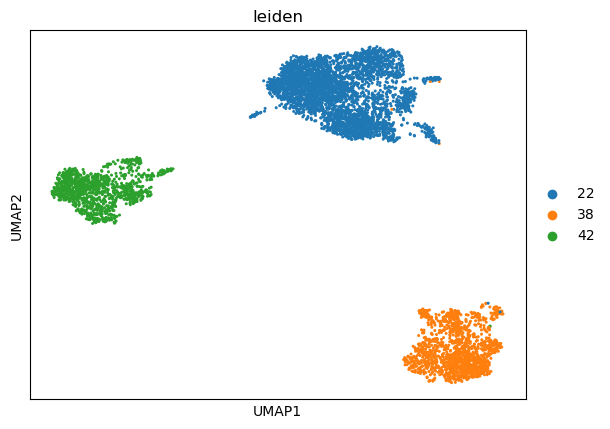

In [49]:
sc.pl.umap(onh_bcell, color=["leiden"])

In [53]:
#### Identification of clusters based on known marker genes for B cell
 
marker_genes_dict = {
    "Naïve B Cells": ["MS4A1", "CD19", "CD22", "TCL1A", "CD83", "SLAMF1"],
    "Memory B cells": ["CD27", "CD24", "FCER2", "CD44"],
    "HSC": ["CD34", "PTPRC", "CD38"],
    "Immature B cell": ["CD19", "MS4A1","CD40"],
    "Transitional": ["BCL2", "MME", "CD28"],
    "B1": ["STAT1", "CD70", "SPN"],   
}

categories: 22, 38, 42
var_group_labels: Naïve B Cells, Memory B cells, HSC, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


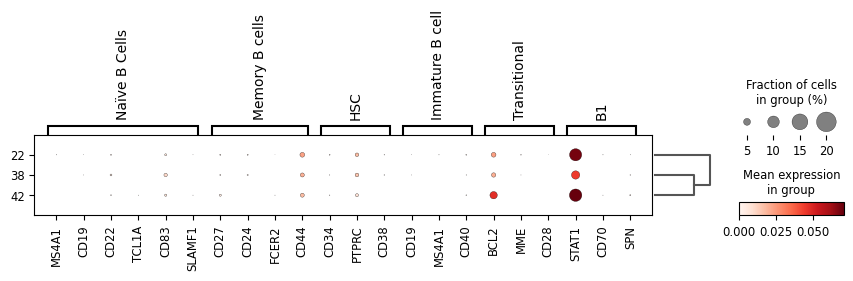

In [54]:
sc.pl.dotplot(onh_bcell, marker_genes_dict, "leiden", dendrogram=True)

In [50]:
onh_bcell

AnnData object with n_obs × n_vars = 6307 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotate_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'sampleid_colors', 'gender_colors', 'ethnicity_colors', 'leiden_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [55]:
sc.write('onh_bcell.h5ad', onh_bcell)

In [56]:
##Recluster fibroblasts
onh_fibro=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Macrophage', 'Melanocyte', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]


In [57]:
onh_fibro

View of AnnData object with n_obs × n_vars = 24258 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


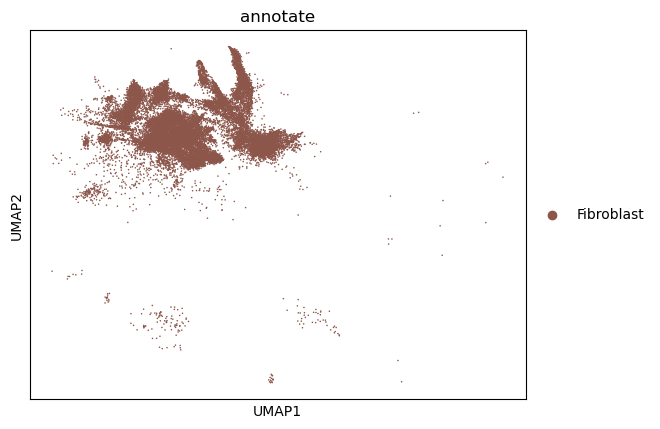

In [58]:
sc.pl.umap(onh_fibro, color = "annotate")

In [60]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_fibro)
# Logarithmize the data
sc.pp.log1p(onh_fibro)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [61]:
sc.pp.highly_variable_genes(onh_fibro, n_top_genes=2000, batch_key="sampleid")

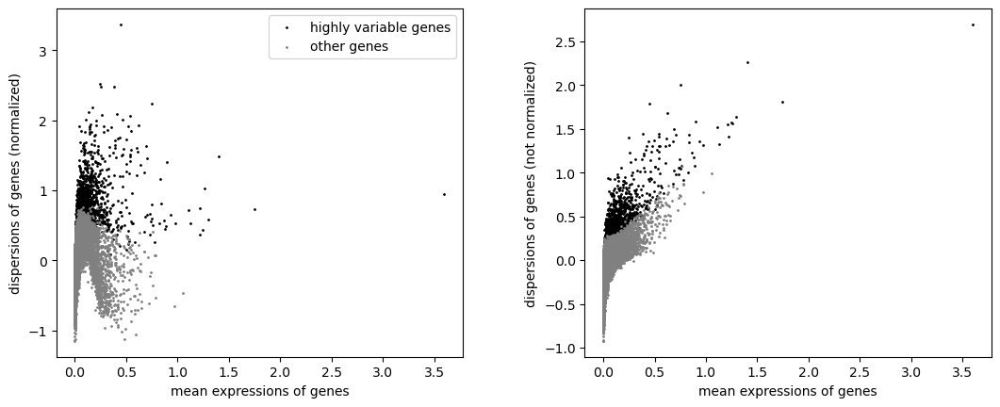

In [62]:
sc.pl.highly_variable_genes(onh_fibro)

In [64]:
sc.tl.pca(onh_fibro)

In [65]:
sc.tl.pca(onh_fibro)

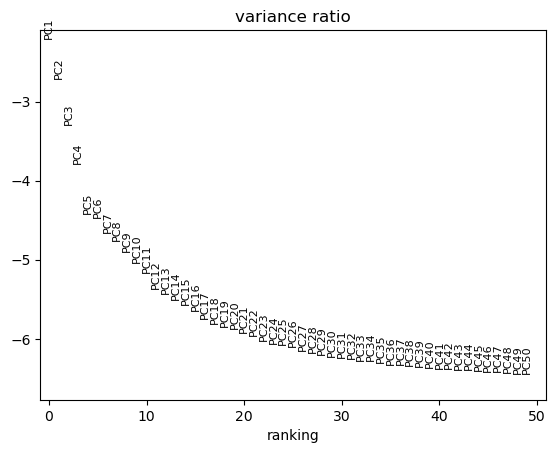

In [66]:
sc.pl.pca_variance_ratio(onh_fibro, n_pcs=50, log=True)

In [68]:
sc.pp.neighbors(onh_fibro)

In [69]:
sc.tl.umap(onh_fibro)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


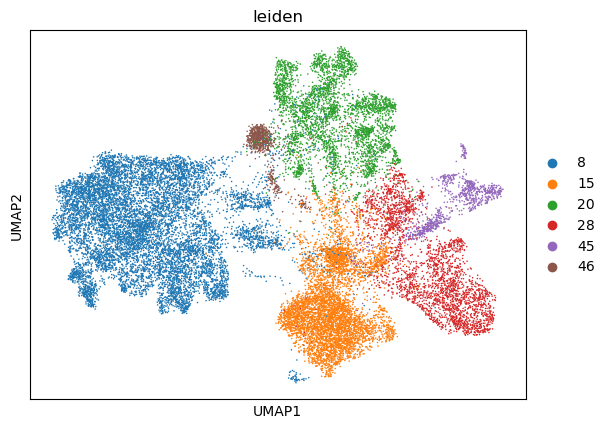

In [70]:
sc.pl.umap(onh_fibro, color=["leiden"])

In [71]:
onh_fibro

AnnData object with n_obs × n_vars = 24258 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotate_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [78]:
for res in [0.02, 0.1, 0.2]:
    sc.tl.leiden(
        onh_fibro, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


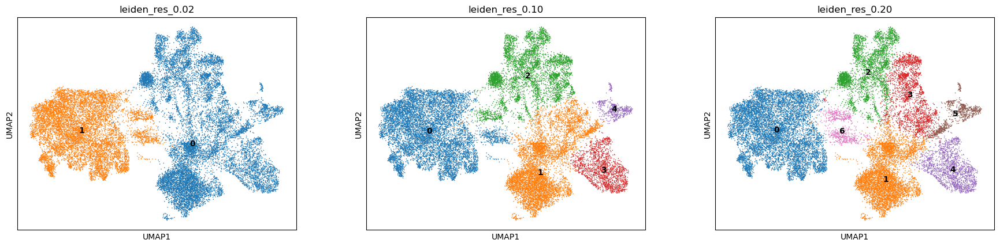

In [79]:
sc.pl.umap(
    onh_fibro,
    color=["leiden_res_0.02", "leiden_res_0.10", "leiden_res_0.20"],
    legend_loc="on data",
)

In [80]:
onh_fibro

AnnData object with n_obs × n_vars = 24258 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate', 'leiden_res_0.04', 'leiden_res_0.03', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.30', 'leiden_res_0.02'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotate_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden_colors', 'leiden', 'leiden_res_0.04_colors', 'leiden_res_0.03_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leiden_res_0.30_colors', 'leiden_res_0.02_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [91]:
### Markers for fibroblasts
marker_genes_dict = {
    "Fibro DCN": ["DCN"],
    "Fibro MGP": ["MGP"],
    "Secretory": ["CCN5", "SLPI", "MFAP5", "TSPAN8", "ID1", "WIF1"],
    "Myofibroblast": ["TNC", "ACTA2","TAGLN"],
    "General fibroblast": ["VIM", "PDGFRA", "FAP", "AIFM2"],
    "Mesenchymal": ["ASPN", "POSTN", "GPC3", "TNN", "SFRP1"], 
    "Pro inflammatory fibro": ["CCL19", "APOE", "CXCL2", "CXCL3", "EFEMP1"],
    "Activated fibro": ["ACTA1", "AIFM2", "IL6", "TNF", "TGFB1", "CD36", "VEGFA", "HGF"],
}

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


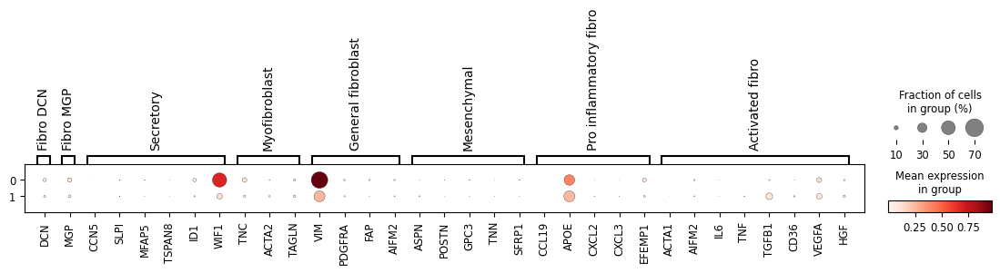

In [94]:
sc.pl.dotplot(onh_fibro, marker_genes_dict, "leiden_res_0.02", dendrogram=True)

categories: 0, 1, 2, etc.
var_group_labels: Fibro DCN, Fibro MGP, Secretory, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


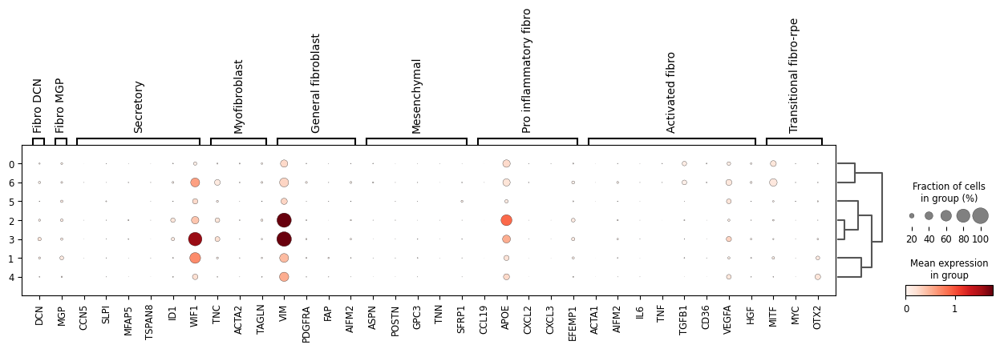

In [90]:
sc.pl.dotplot(onh_fibro, marker_genes_dict, "leiden_res_0.20", dendrogram=True)

In [112]:
onh_fibro.obs["cell_type"] = onh_fibro.obs["leiden_res_0.20"].map(
    {
        "0": "Fibro VIM",
        "1": "Fibro WIF1",
        "2": "Fibro APOE",
        "3": "Fibro WIF1",
        "4": "Fibro WIF1",
        "5": "Fibro WIF1",
        "6": "Fibro WIF1",
    }
)

In [113]:
onh_fibro

AnnData object with n_obs × n_vars = 24258 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate', 'leiden_res_0.04', 'leiden_res_0.03', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.30', 'leiden_res_0.02', 'cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotate_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden_colors', 'leiden', 'leiden_res_0.04_colors', 'leiden_res_0.03_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leiden_res_0.30_colors', 'leiden_res_0.02_colors', 'dendrogram_leiden_res_0.10', 'dendrogram_leiden_res_0.20', 'cell_type_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


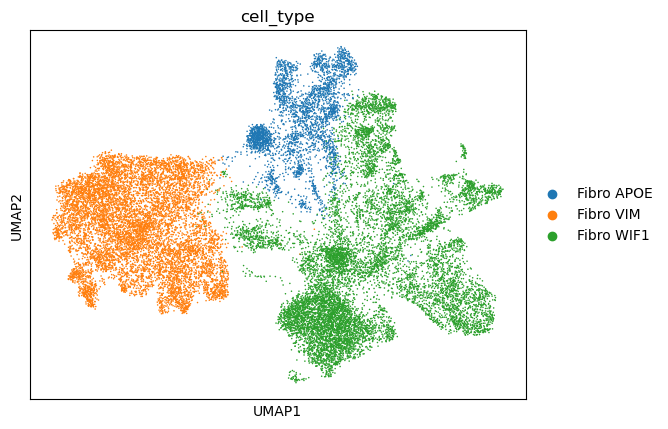

In [115]:
sc.pl.umap(onh_fibro, color=["cell_type"])

In [116]:
sc.write('onh_fibro.h5ad', onh_fibro)

In [118]:
#Clustering macrophages to find microglial cells
onh_macro=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Fibroblast', 'Melanocyte', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]

In [119]:
onh_macro.obs["annotate"]

onhMMD_23_4840_ONH_ACTCCCATCACTGTTT-1     Macrophage
onhMMD_23_4840_ONH_AGACAAATCTACGCAA-1     Macrophage
onhMMD_23_4840_ONH_AGATCGTCATGGCGCT-1     Macrophage
onhMMD_23_4840_ONH_AGGATCTAGGGAGGTG-1     Macrophage
onhMMD_23_4840_ONH_AGGCATTAGTTTCGGT-1     Macrophage
                                             ...    
onh23_0574_ONH_bead_CGTAGTATCACCCTCA-1    Macrophage
onh23_0574_ONH_bead_GGGAAGTCACTGCTTC-1    Macrophage
onh23_0574_ONH_bead_TAAGCACCAGAGATTA-1    Macrophage
onh23_0574_ONH_bead_TATATCCTCTCAAAGC-1    Macrophage
onh23_0574_ONH_bead_TTTACTGAGGAGAGGC-1    Macrophage
Name: annotate, Length: 1501, dtype: category
Categories (1, object): ['Macrophage']

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


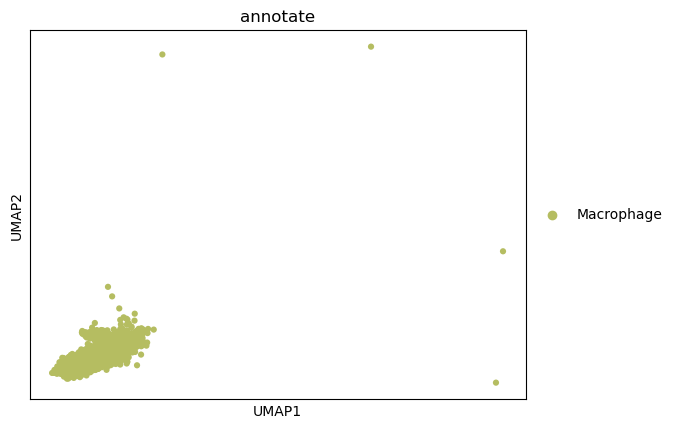

In [120]:
sc.pl.umap(onh_macro, color = "annotate")

In [121]:
onh_macro

View of AnnData object with n_obs × n_vars = 1501 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

In [122]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_macro)
# Logarithmize the data
sc.pp.log1p(onh_macro)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [123]:
sc.pp.highly_variable_genes(onh_macro, n_top_genes=2000, batch_key="sampleid")

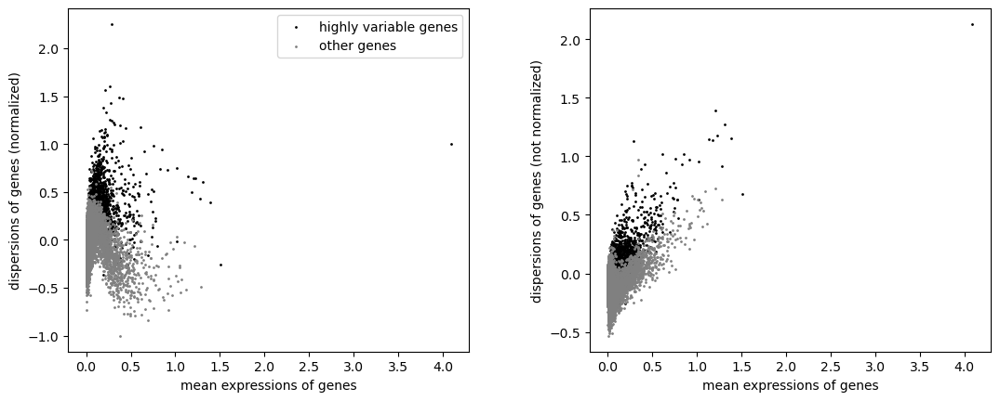

In [124]:
sc.pl.highly_variable_genes(onh_macro)

In [125]:
sc.tl.pca(onh_macro)

In [ ]:
sc.pl.pca_variance_ratio(onh_macro, n_pcs=50, log=True)

In [126]:
sc.pp.neighbors(onh_macro)

In [127]:
sc.tl.umap(onh_macro)

In [130]:
for res in [0.02, 0.01, 0.03]:
    sc.tl.leiden(
        onh_macro, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


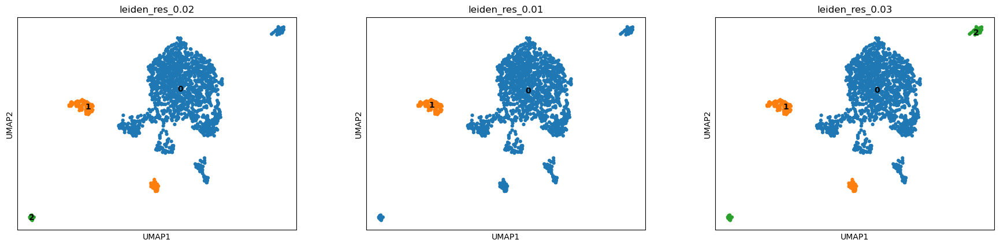

In [131]:
sc.pl.umap(
    onh_macro,
    color=["leiden_res_0.02", "leiden_res_0.01", "leiden_res_0.03"],
    legend_loc="on data",
)

In [134]:
###Microglia are possible to be on macrophage clusters due to molecular profile
marker_genes_dict = {
    "Resting microglia": ["TMEM119", "P2RY12", "CX3CR1", "TREM2", "SALL1", "C1QA"],
    "Activated microglia": ["FCRL3", "FCRLA", "TNF", "IL1B", "NOS2", "MMP9", "NLRP3", "S100A8", "S100A9"],
    "Microglia": ["C1QA", "P2RY12", "CD74", "CSF1R", "AIF1", "CX3CR1", "TMEM119"],
}

categories: 0, 1, 2
var_group_labels: Resting microglia, Activated microglia, Microglia


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


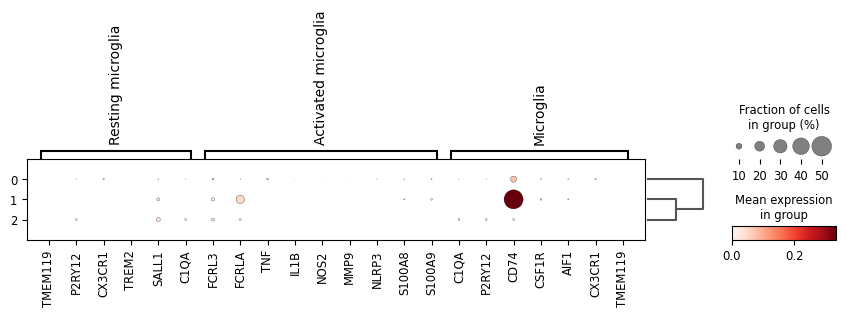

In [135]:
sc.pl.dotplot(onh_macro, marker_genes_dict, "leiden_res_0.03", dendrogram=True)

In [138]:
###Macrophage subtypes
marker_genes_dict = {
    "perivascular macrophage": ["CD163", "MRC1"],
    "Monocyte-derived": ["NOS2", "CD86", "ARG1", "MRC1"],
    "Resident macrophages": ["ADGRE1", "CSF1R", "TNF"],
    "Microglia": ["C1QA", "P2RY12", "CD74", "CSF1R", "AIF1", "CX3CR1", "TMEM119"],
    "Macrophage": ["CD14", "FCGR3A", "FCGR1A", "CD68", "TFRC", "CCR5"]
}

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


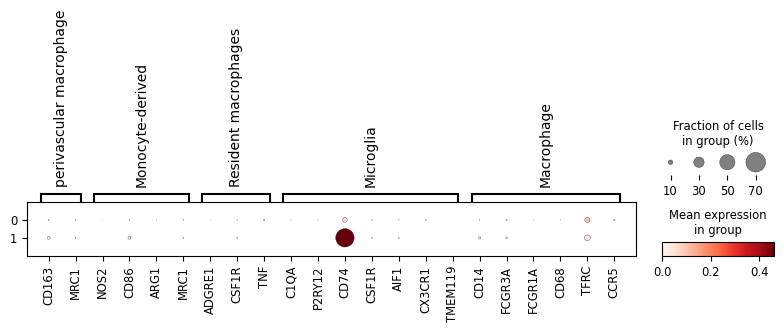

In [140]:
sc.pl.dotplot(onh_macro, marker_genes_dict, "leiden_res_0.01", dendrogram=True)

In [141]:
onh_macro.obs["cell_type"] = onh_macro.obs["leiden_res_0.01"].map(
    {
        "0": "Macrophage",
        "1": "Microglia",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


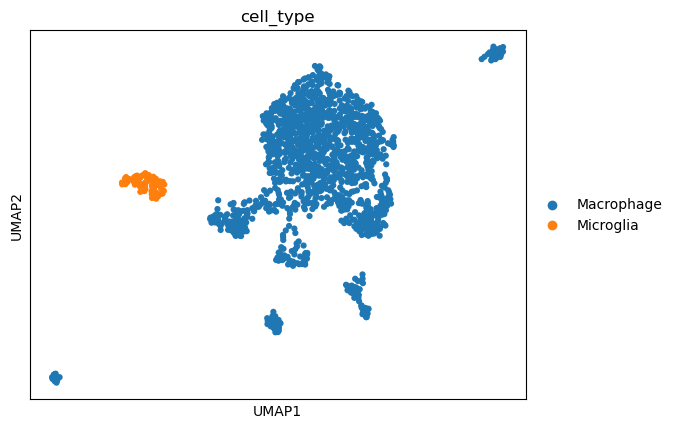

In [142]:
sc.pl.umap(onh_macro, color = "cell_type")

In [143]:
sc.write('onh_macro.h5ad', onh_macro)

In [144]:
onh_macro

AnnData object with n_obs × n_vars = 1501 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate', 'leiden_res_0.02', 'leiden_res_0.10', 'leiden_res_0.20', 'leiden_res_0.01', 'leiden_res_0.03', 'cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotate_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_res_0.02_colors', 'leiden_res_0.10_colors', 'leiden_res_0.20_colors', 'leiden_res_0.01_colors', 'leiden_res_0.03_colors', 'dendrogram_leiden_res_0.03', 'cell_type_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
##Proceed with Pericyte, Schwann, T cell, Vasc endo, lamina cribrosa and review astrocytes and oligo clustering

In [148]:
onh_melano=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Fibroblast', 'Macrophage', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]

In [149]:
onh_melano

View of AnnData object with n_obs × n_vars = 6288 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


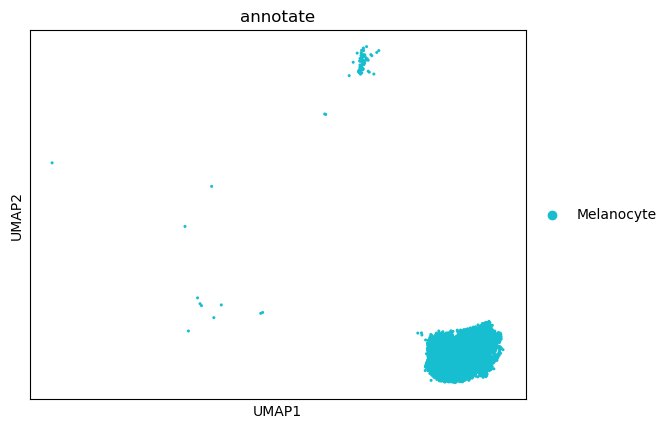

In [150]:
sc.pl.umap(onh_melano, color = "annotate")

In [154]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_melano)
# Logarithmize the data
sc.pp.log1p(onh_melano)

In [155]:
sc.pp.highly_variable_genes(onh_melano, n_top_genes=2000, batch_key="sampleid")

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:247: RuntimeWarning: invalid value encountered in divide
  df["dispersions_norm"] = (
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:247: RuntimeWarning: invalid value encountered in divide
  df["dispersions_norm"] = (
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:279: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(


ZeroDivisionError: division by zero

In [156]:
sc.pl.highly_variable_genes(onh_melano)

KeyError: 'hvg'

In [157]:
sc.tl.pca(onh_melano)

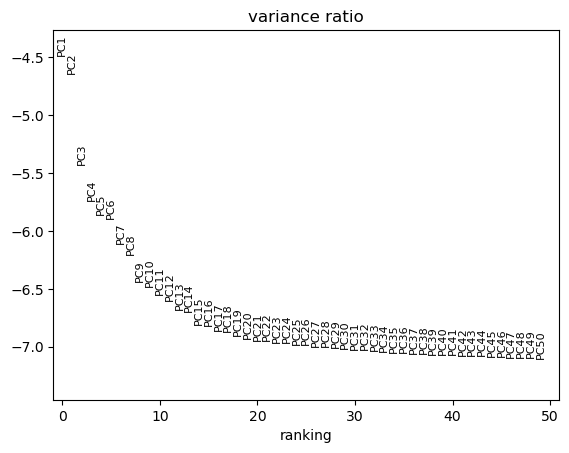

In [158]:
sc.pl.pca_variance_ratio(onh_melano, n_pcs=50, log=True)

In [160]:
sc.pp.neighbors(onh_melano)

In [161]:
sc.tl.umap(onh_melano)

In [174]:
for res in [0.03, 0.04, 0.05]:
    sc.tl.leiden(
        onh_melano, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


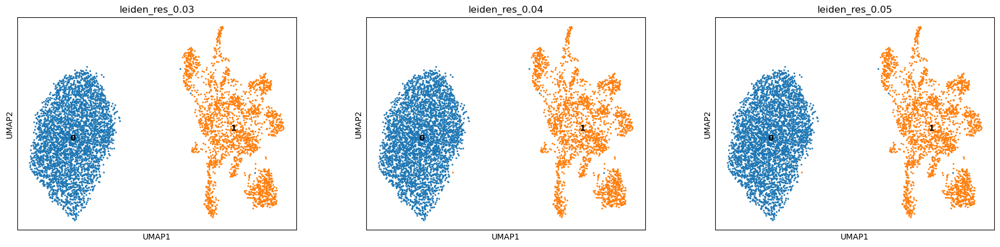

In [175]:
sc.pl.umap(
    onh_melano,
    color=["leiden_res_0.03", "leiden_res_0.04", "leiden_res_0.05"],
    legend_loc="on data",
)

In [176]:
###Melanocyte subtypes
marker_genes_dict = {
    "Melanocyte": ["MITF", "PTEN", "TYR", "DCT", "PMEL", "MLANA", "SOX10", "GPNMB", "KIT"],
}

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


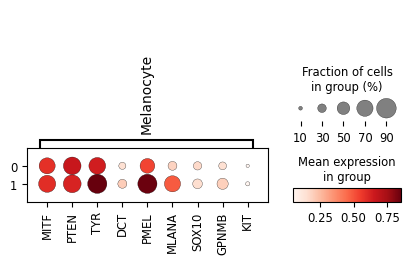

In [178]:
sc.pl.dotplot(onh_melano, marker_genes_dict, "leiden_res_0.05", dendrogram=True)

In [180]:
onh_melano.obs["cell_type"] = onh_melano.obs["leiden_res_0.05"].map(
    {
        "0": "Melanocyte",
        "1": "Melano MLANA+",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


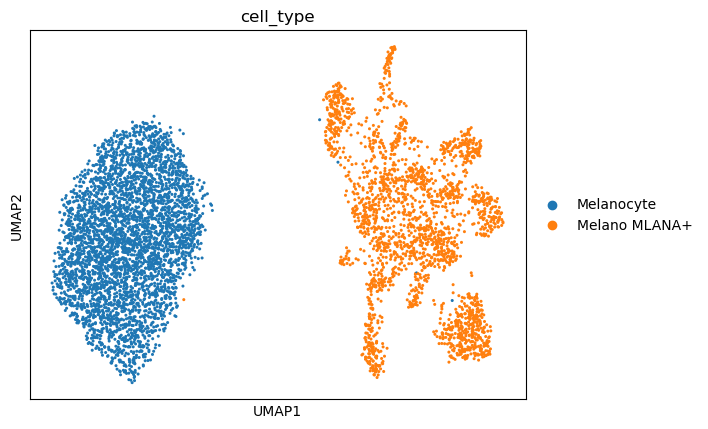

In [181]:
sc.pl.umap(onh_melano, color = "cell_type")

In [182]:
sc.write('onh_melanocyte.h5ad', onh_melano)

In [183]:
#### Lets play with Oligodendrocytes
onh_oligo=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Fibroblast', 'Macrophage', 'Melanocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]

In [184]:
onh_oligo

View of AnnData object with n_obs × n_vars = 2472 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


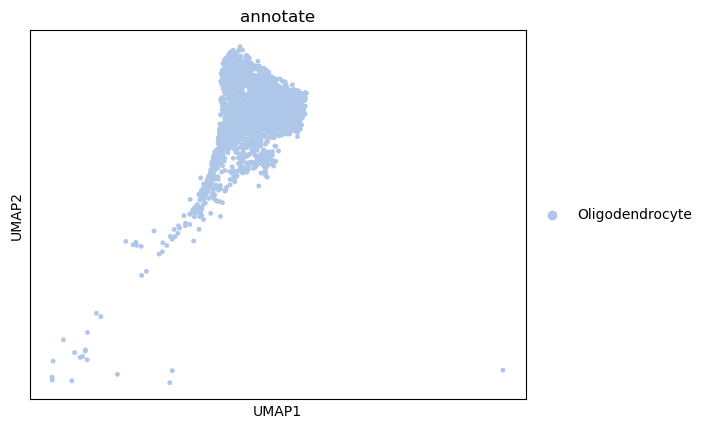

In [185]:
sc.pl.umap(onh_oligo, color = "annotate")

In [186]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_oligo)
# Logarithmize the data
sc.pp.log1p(onh_oligo)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [187]:
sc.pp.highly_variable_genes(onh_oligo, n_top_genes=2000, batch_key="sampleid")

ZeroDivisionError: division by zero

In [188]:
sc.pl.highly_variable_genes(onh_oligo)

KeyError: 'hvg'

In [189]:
sc.tl.pca(onh_oligo)

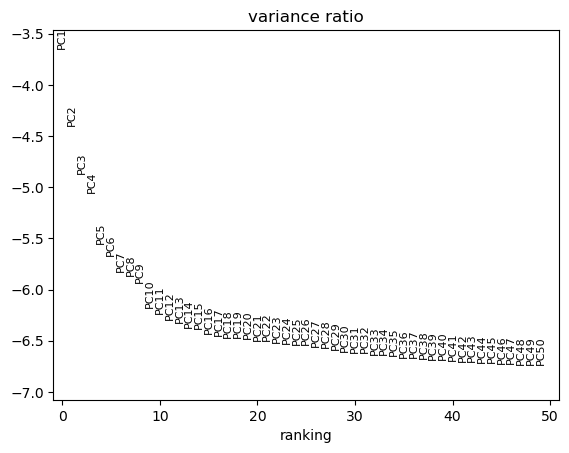

In [190]:
sc.pl.pca_variance_ratio(onh_oligo, n_pcs=50, log=True)

In [191]:
sc.pp.neighbors(onh_oligo)

In [192]:
sc.tl.umap(onh_oligo)

In [193]:
for res in [0.03, 0.04, 0.05]:
    sc.tl.leiden(
        onh_oligo, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


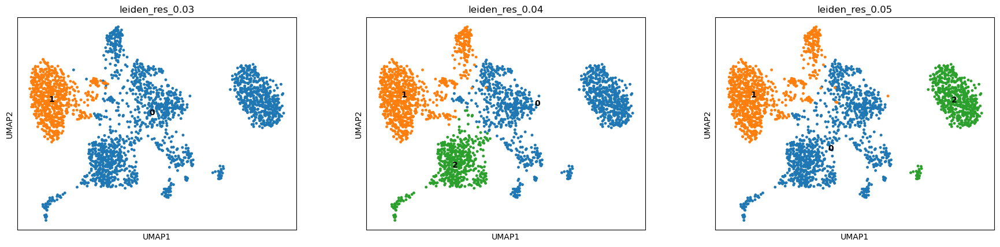

In [194]:
sc.pl.umap(
    onh_oligo,
    color=["leiden_res_0.03", "leiden_res_0.04", "leiden_res_0.05"],
    legend_loc="on data",
)

In [195]:
###Oligodendrocyte subtypes
marker_genes_dict = {
    "OPC": ["PDGFRA", "CSPG4", "CD9", "GPR17", "OLIG2"],
    "CPC": ["SOX10", "PDGFRA", "OLIG1"],
    "Immature oligo": ["MOG", "NKX2-2"],
    "Mature oligo": ["MBP", "MAG", "PLP1"],
    "Myelinating oligo": ["OPALIN", "MBP", "MYRF"],
}

categories: 0, 1, 2
var_group_labels: OPC, CPC, Immature oligo, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


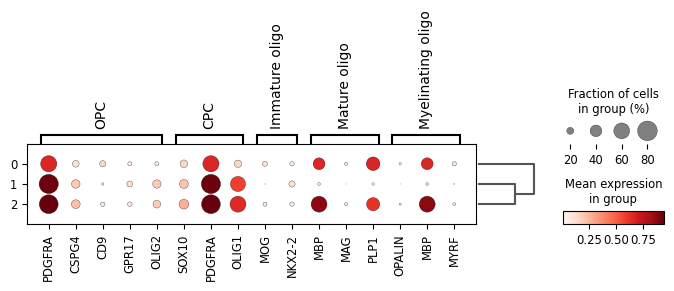

In [196]:
sc.pl.dotplot(onh_oligo, marker_genes_dict, "leiden_res_0.05", dendrogram=True)

In [197]:
onh_oligo.obs["cell_type"] = onh_oligo.obs["leiden_res_0.05"].map(
    {
        "0": "Oligodendrocyte",
        "1": "OPC",
        "2": "Oligodendrocyte",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


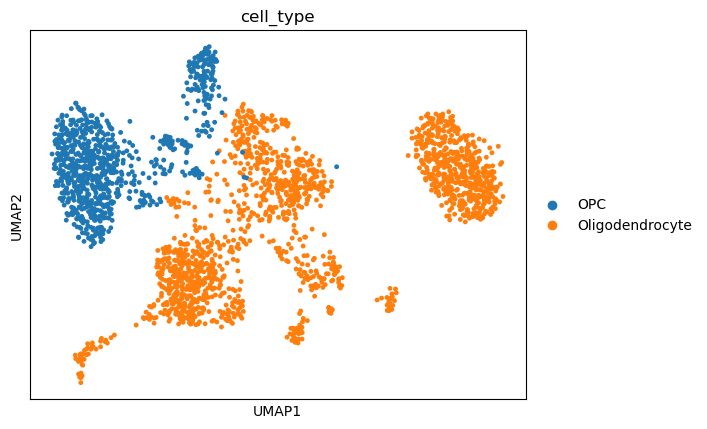

In [198]:
sc.pl.umap(onh_oligo, color = "cell_type")

In [199]:
sc.write('onh_oligodendrocyte.h5ad', onh_oligo)

In [ ]:
## Take a look on oligodendrocyte mbp+ cluster to see the difference between the previous oligo cluster


In [202]:
onh_oligo=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Fibroblast', 'Macrophage', 'Melanocyte', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]

In [203]:
onh_oligo

View of AnnData object with n_obs × n_vars = 45004 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


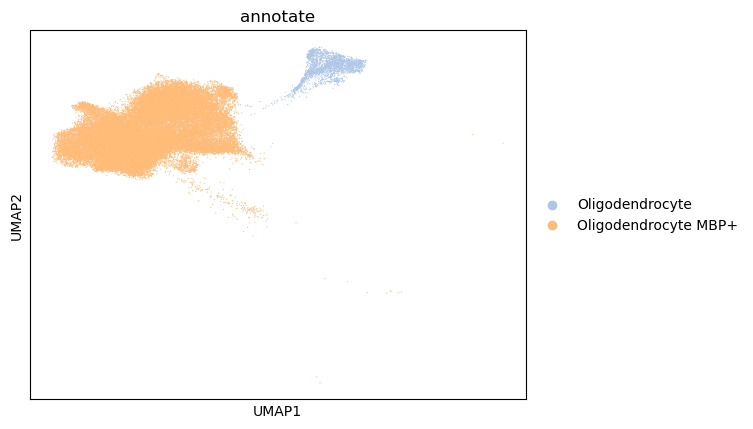

In [204]:
sc.pl.umap(onh_oligo, color = "annotate")

In [205]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_oligo)
# Logarithmize the data
sc.pp.log1p(onh_oligo)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [206]:
sc.pp.highly_variable_genes(onh_oligo, n_top_genes=2000, batch_key="sampleid")

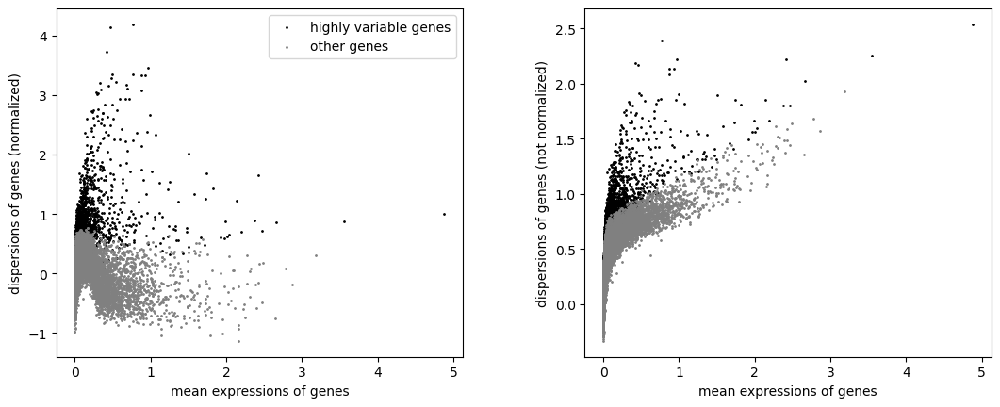

In [207]:
sc.pl.highly_variable_genes(onh_oligo)

In [208]:
sc.tl.pca(onh_oligo)

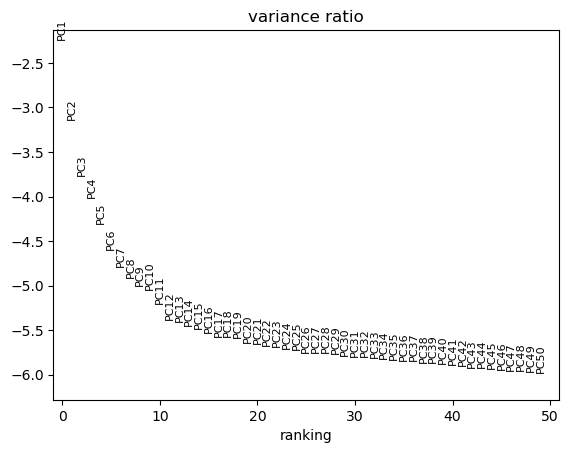

In [209]:
sc.pl.pca_variance_ratio(onh_oligo, n_pcs=50, log=True)

In [210]:
sc.pp.neighbors(onh_oligo)

In [212]:
sc.tl.umap(onh_oligo)

In [213]:
for res in [0.03, 0.04, 0.05]:
    sc.tl.leiden(
        onh_oligo, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


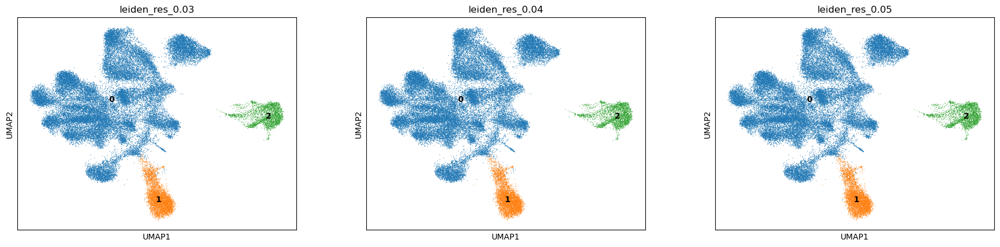

In [214]:
sc.pl.umap(
    onh_oligo,
    color=["leiden_res_0.03", "leiden_res_0.04", "leiden_res_0.05"],
    legend_loc="on data",
)

In [215]:
###Oligodendrocyte subtypes
marker_genes_dict = {
    "OPC": ["PDGFRA", "CSPG4", "CD9", "GPR17", "OLIG2"],
    "CPC": ["SOX10", "PDGFRA", "OLIG1"],
    "Immature oligo": ["MOG", "NKX2-2"],
    "Mature oligo": ["MBP", "MAG", "PLP1"],
    "Myelinating oligo": ["OPALIN", "MBP", "MYRF"],
}

categories: 0, 1, 2
var_group_labels: OPC, CPC, Immature oligo, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


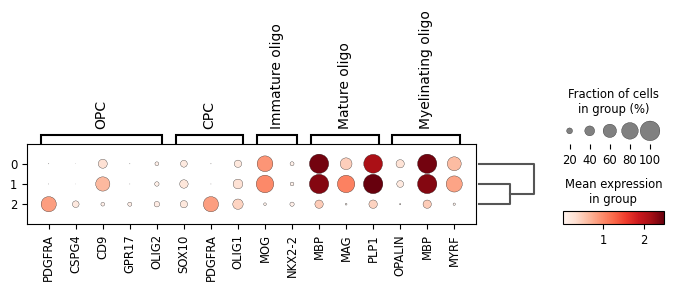

In [216]:
sc.pl.dotplot(onh_oligo, marker_genes_dict, "leiden_res_0.05", dendrogram=True)

In [217]:
onh_oligo.obs["cell_type"] = onh_oligo.obs["leiden_res_0.05"].map(
    {
        "0": "Oligodendrocyte MBP+",
        "1": "Oligodendrocyte MBP+",
        "2": "OPC",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


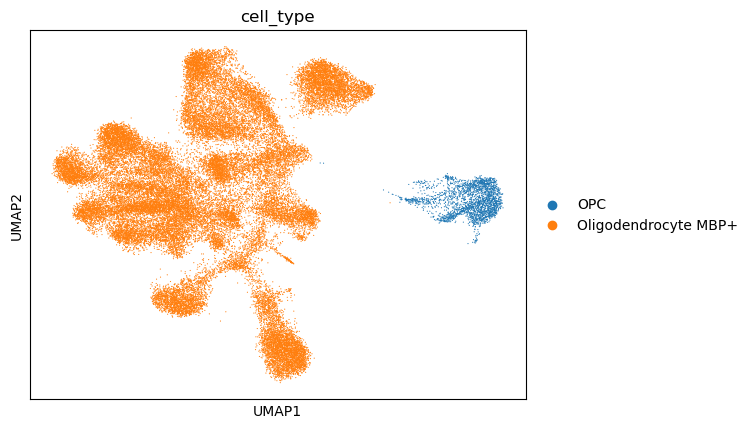

In [218]:
sc.pl.umap(onh_oligo, color = "cell_type")

In [219]:
sc.write('onh_oligodendrocyte.h5ad', onh_oligo)

In [220]:
###Lets subcluster the Pericytes
onh_pericyte=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Fibroblast', 'Macrophage', 'Melanocyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Schwann', 'T Cell', 'Vascular Endothelial'])]

In [221]:
onh_pericyte

View of AnnData object with n_obs × n_vars = 6451 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


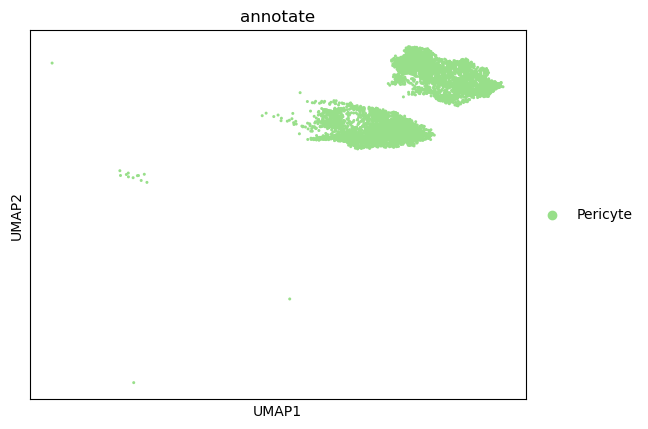

In [222]:
sc.pl.umap(onh_pericyte, color = "annotate")

In [223]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_pericyte)
# Logarithmize the data
sc.pp.log1p(onh_pericyte)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [224]:
sc.pp.highly_variable_genes(onh_pericyte, n_top_genes=2000, batch_key="sampleid")

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:247: RuntimeWarning: invalid value encountered in divide
  df["dispersions_norm"] = (
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:279: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(


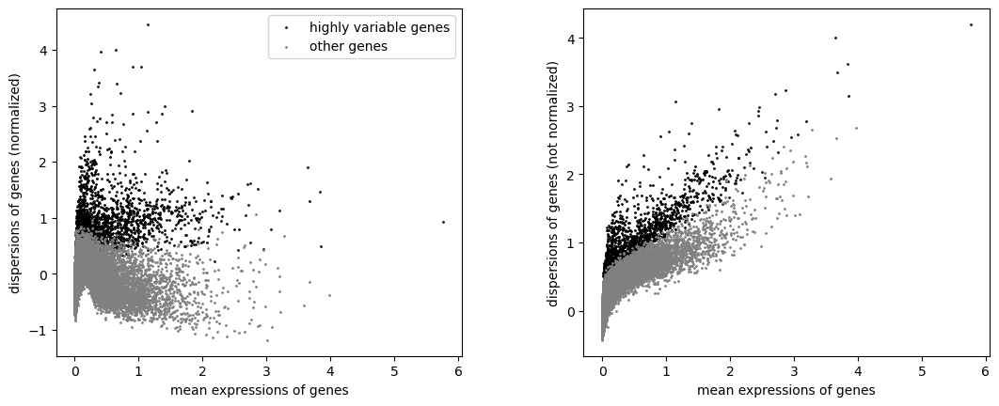

In [225]:
sc.pl.highly_variable_genes(onh_pericyte)

In [226]:
sc.tl.pca(onh_pericyte)

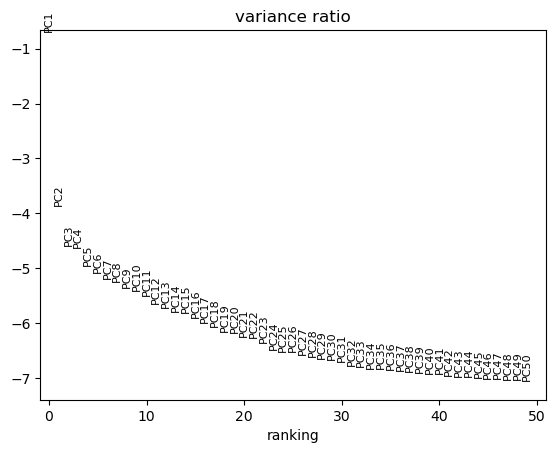

In [227]:
sc.pl.pca_variance_ratio(onh_pericyte, n_pcs=50, log=True)

In [228]:
sc.pp.neighbors(onh_pericyte)

In [229]:
sc.tl.umap(onh_pericyte)

In [232]:
for res in [0.01, 0.02, 0.03]:
    sc.tl.leiden(
        onh_pericyte, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


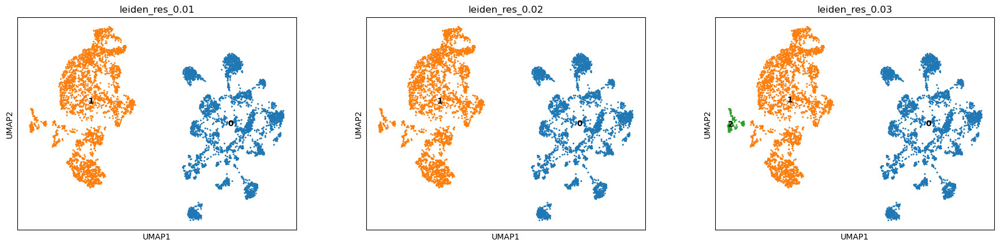

In [233]:
sc.pl.umap(
    onh_pericyte,
    color=["leiden_res_0.01", "leiden_res_0.02", "leiden_res_0.03"],
    legend_loc="on data",
)

In [234]:
### Pericyte subtypes
marker_genes_dict = {
    "Pericyte": ["B3GAT3", "GPC6", "VTN", "SPOCK2", "BMP3", "ENDOG"],
}

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


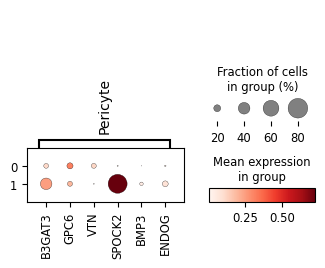

In [235]:
sc.pl.dotplot(onh_pericyte, marker_genes_dict, "leiden_res_0.02", dendrogram=True)

In [236]:
onh_pericyte.obs["cell_type"] = onh_pericyte.obs["leiden_res_0.02"].map(
    {
        "0": "Pericyte GPC6+",
        "1": "Pericyte SPOCK2+",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


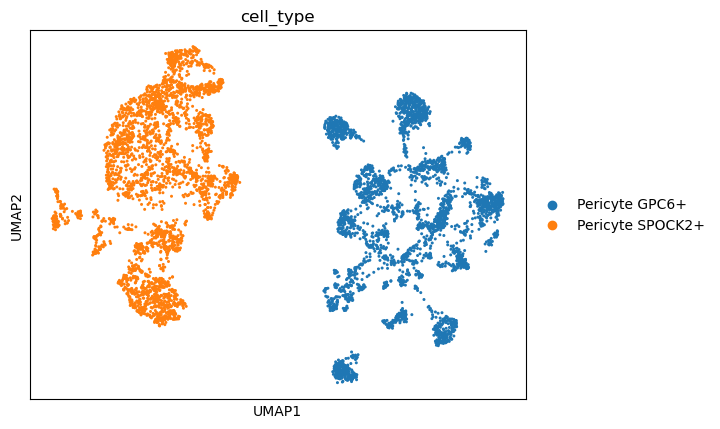

In [237]:
sc.pl.umap(onh_pericyte, color = "cell_type")

In [238]:
sc.write('onh_pericyte.h5ad', onh_pericyte)

In [239]:
### Schwann cells
onh_schwann=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Macrophage', 'Melanocyte', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Fibroblast', 'T Cell', 'Vascular Endothelial'])]

In [240]:
onh_schwann

View of AnnData object with n_obs × n_vars = 25428 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


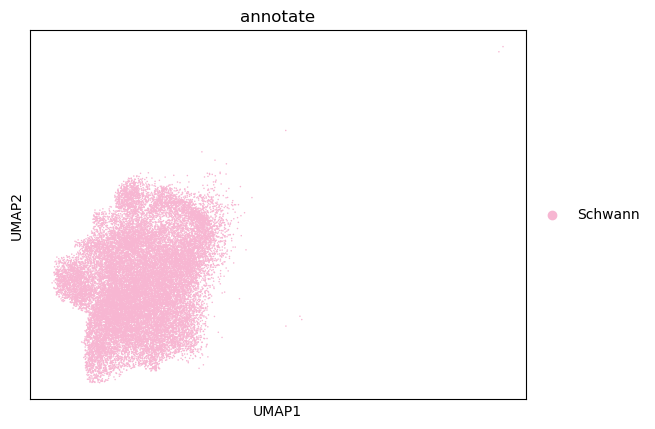

In [241]:
sc.pl.umap(onh_schwann, color = "annotate")

In [242]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_schwann)
# Logarithmize the data
sc.pp.log1p(onh_schwann)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [243]:
sc.pp.highly_variable_genes(onh_schwann, n_top_genes=2000, batch_key="sampleid")

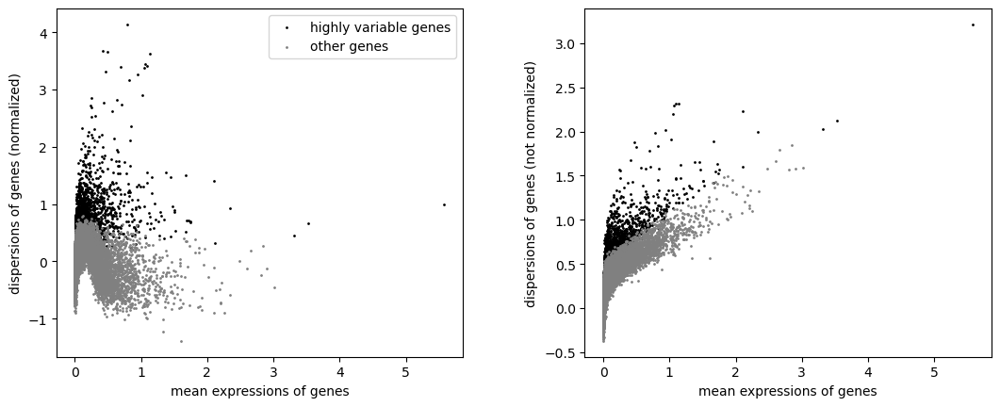

In [244]:
sc.pl.highly_variable_genes(onh_schwann)

In [245]:
sc.tl.pca(onh_schwann)

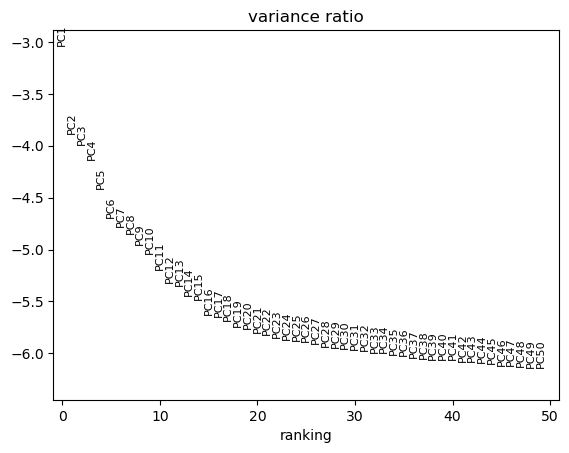

In [246]:
sc.pl.pca_variance_ratio(onh_schwann, n_pcs=50, log=True)

In [247]:
sc.pp.neighbors(onh_schwann)

In [248]:
sc.tl.umap(onh_schwann)

In [251]:
for res in [0.02, 0.04, 0.10]:
    sc.tl.leiden(
        onh_schwann, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


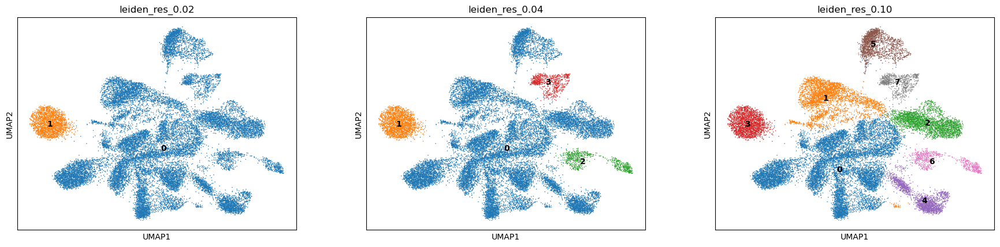

In [252]:
sc.pl.umap(
    onh_schwann,
    color=["leiden_res_0.02", "leiden_res_0.04", "leiden_res_0.10"],
    legend_loc="on data",
)

In [255]:
### Schwann cell markers subtypes
marker_genes_dict = {
    "Schwann cell precursor": ["SOX10", "FABP7", "MPZ", "NGFR", "S100B", "S100A1"],
    "Myelinating Schwann cell": ["EGR2", "MBP", "MPZ", "S100A1", "S100B", "SYT1"],
    "Non-Myelinating Schwann cell": ["GAP43", "NGFR", "SOX10"],
    
}

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


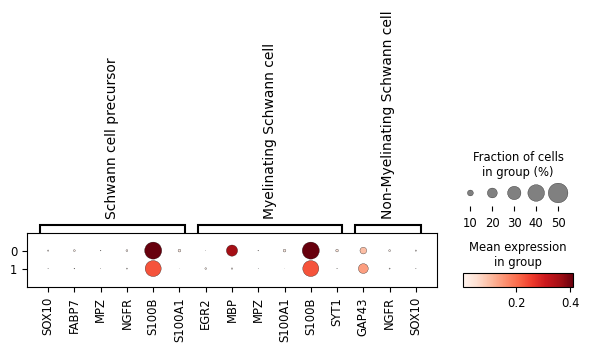

In [256]:
sc.pl.dotplot(onh_schwann, marker_genes_dict, "leiden_res_0.02", dendrogram=True)

In [257]:
onh_schwann.obs["cell_type"] = onh_schwann.obs["leiden_res_0.02"].map(
    {
        "0": "Myelinating Schwann cell",
        "1": "Non-Myelinating Schwann cell",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


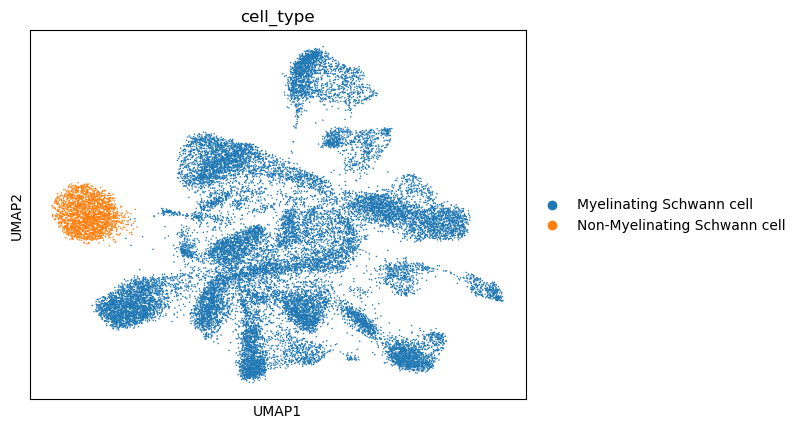

In [258]:
sc.pl.umap(onh_schwann, color = "cell_type")

In [259]:
sc.write('onh_schwann.h5ad', onh_schwann)

In [260]:
### T cells
onh_tcell=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Macrophage', 'Melanocyte', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Fibroblast', 'Schwann', 'Vascular Endothelial'])]

In [261]:
onh_tcell

View of AnnData object with n_obs × n_vars = 8677 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


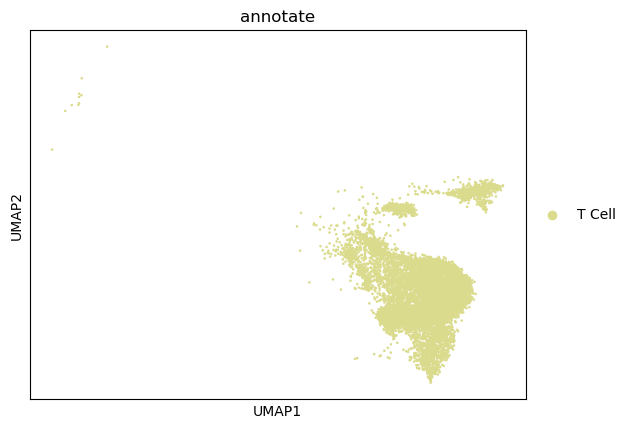

In [262]:
sc.pl.umap(onh_tcell, color = "annotate")

In [263]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_tcell)
# Logarithmize the data
sc.pp.log1p(onh_tcell)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [265]:
sc.pp.highly_variable_genes(onh_tcell, n_top_genes=2000, batch_key="sampleid")

ZeroDivisionError: division by zero

In [266]:
sc.pl.highly_variable_genes(onh_tcell)

KeyError: 'hvg'

In [267]:
sc.tl.pca(onh_tcell)

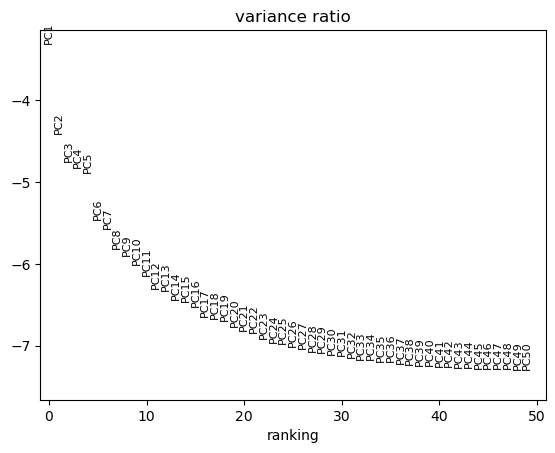

In [268]:
sc.pl.pca_variance_ratio(onh_tcell, n_pcs=50, log=True)

In [269]:
sc.pp.neighbors(onh_tcell)

In [270]:
sc.tl.umap(onh_tcell)

In [271]:
for res in [0.02, 0.04, 0.10]:
    sc.tl.leiden(
        onh_tcell, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


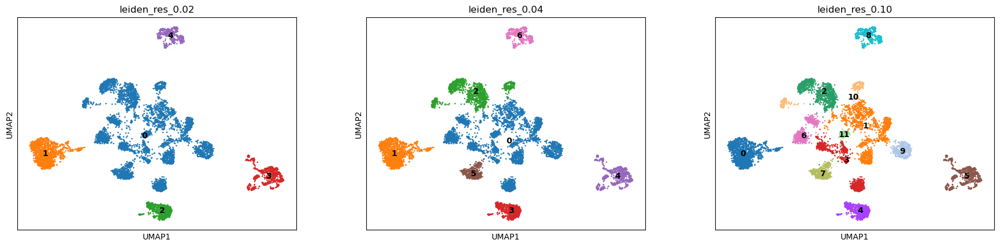

In [272]:
sc.pl.umap(
    onh_tcell,
    color=["leiden_res_0.02", "leiden_res_0.04", "leiden_res_0.10"],
    legend_loc="on data",
)

In [273]:
### T cell markers subtypes
marker_genes_dict = {
    "CD4+ T Helper (Th) Cells": ["CD4", "IFNG", "TBX21", "CXCR3", "IL4", "GATA3", "RORC"],
    "T Regulatory (Treg) Cells": ["FOXP3", "IL2RA", "CTLA4"],
    "Lymphocytes": ["CD8A", "GZMB", "PRF1"],
    "Effector Memory T Cells (Tem)": ["CX3CR1", "GZMK"],
    "Natural Killer T (NKT) Cells": ["TRAV10", "NCAM1", "ZBTB16"],
    
}

In [301]:
onh_tcell

AnnData object with n_obs × n_vars = 8677 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate', 'leiden_res_0.02', 'leiden_res_0.04', 'leiden_res_0.10', 'cell_type', 'leiden_res_0.05'
    uns: 'annotate_colors', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_res_0.02_colors', 'leiden_res_0.04_colors', 'leiden_res_0.10_colors', 'dendrogram_leiden_res_0.02', 'cell_type_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

categories: 0, 1, 2, etc.
var_group_labels: CD4+ T Helper (Th) Cells, T Regulatory (Treg) Cells, Lymphocytes, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


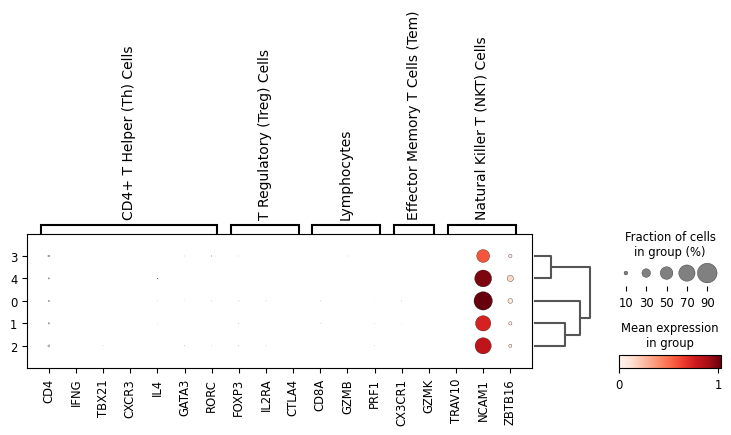

In [274]:
sc.pl.dotplot(onh_tcell, marker_genes_dict, "leiden_res_0.02", dendrogram=True)

In [275]:
onh_tcell.obs["cell_type"] = onh_tcell.obs["leiden_res_0.02"].map(
    {
        "0": "Natural Killer T cell",
        "1": "Natural Killer T cell",
        "2": "Natural Killer T cell",
        "3": "Natural Killer T cell",
        "4": "Natural Killer T cell",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


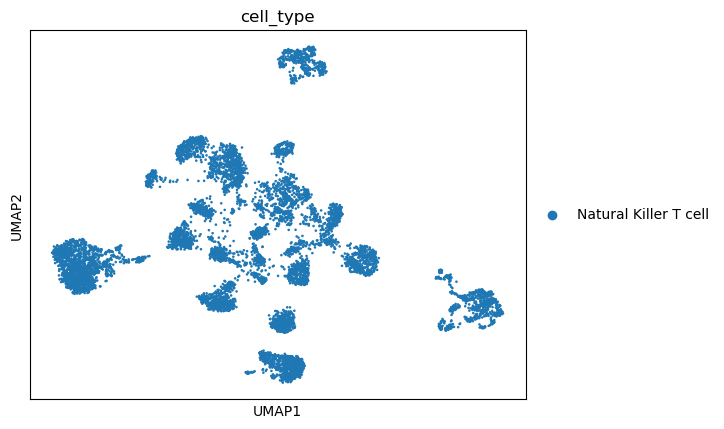

In [276]:
sc.pl.umap(onh_tcell, color = "cell_type")

In [277]:
sc.write('onh_tcells.h5ad', onh_tcell)

In [278]:
## last ONH cluster - Vasc endothelial cells
onh_vascendo=onh[~onh.obs['annotate'].isin(['Amacrine','Astrocyte', 'Astrocyte GFAP+', 'Bipolar', 'B Cell', 'Horizontal', 'Macrophage', 'Melanocyte', 'Oligodendrocyte', 'Oligodendrocyte MBP+', 'Pericyte', 'Photoreceptor', 'Pigment Epithelium', 'RPE', 'Fibroblast', 'Schwann', 'T Cell'])]

In [279]:
onh_vascendo

View of AnnData object with n_obs × n_vars = 46755 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


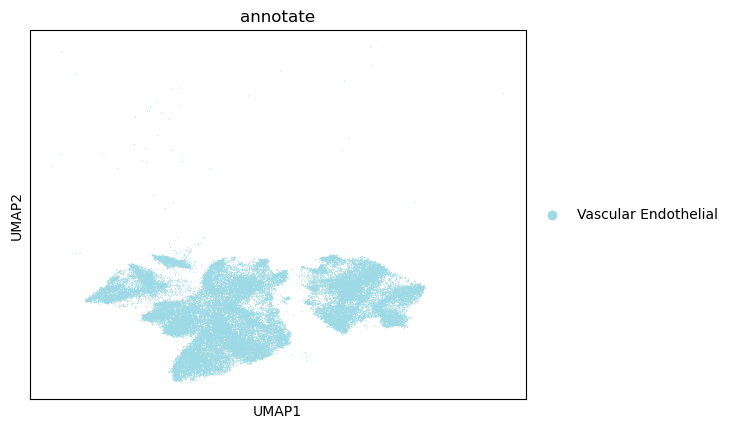

In [280]:
sc.pl.umap(onh_vascendo, color = "annotate")

In [281]:
# Normalizing to median total counts
sc.pp.normalize_total(onh_vascendo)
# Logarithmize the data
sc.pp.log1p(onh_vascendo)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [282]:
sc.pp.highly_variable_genes(onh_vascendo, n_top_genes=2000, batch_key="sampleid")

In [314]:
hv_genes_df = onh_vascendo.var.loc[onh_vascendo.var['highly_variable']]
print(hv_genes_df)

            highly_variable     means  dispersions  dispersions_norm  \
HES4                   True  0.162791     0.900117          0.917649   
ISG15                  True  0.060859     0.647495          0.668581   
PRDM16                 True  0.154436     0.820749          0.945658   
ERRFI1                 True  0.259562     1.139470          1.229426   
SPSB1                  True  0.167331     0.693110          0.651813   
...                     ...       ...          ...               ...   
MT-ND3                 True  0.627146     1.539996          1.294627   
MT-ND4                 True  0.779358     1.795420          1.316191   
MT-ND5                 True  0.278158     0.944955          0.797313   
MT-CYB                 True  0.746029     1.746073          1.358908   
AC007325.4             True  0.006884     0.431433          0.363379   

            highly_variable_nbatches  highly_variable_intersection  
HES4                              10                         False

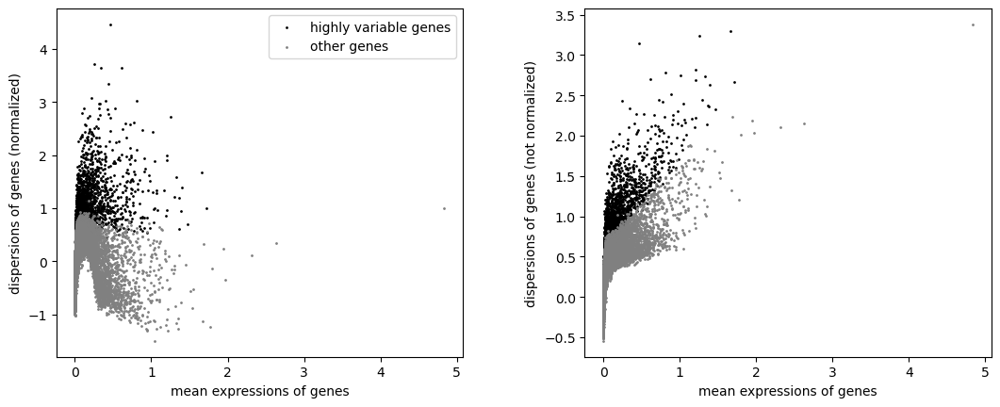

In [283]:
sc.pl.highly_variable_genes(onh_vascendo)

In [284]:
sc.tl.pca(onh_vascendo)

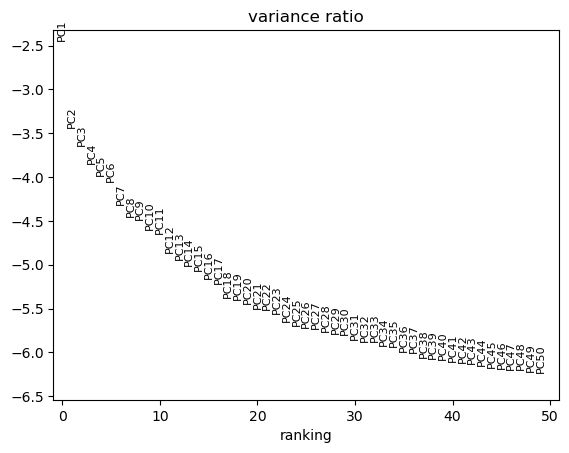

In [285]:
sc.pl.pca_variance_ratio(onh_vascendo, n_pcs=50, log=True)

In [296]:
sc.pp.neighbors(onh_vascendo)

In [297]:
sc.tl.umap(onh_vascendo)

In [308]:
for res in [0.01, 0.02, 0.03]:
    sc.tl.leiden(
        onh_vascendo, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


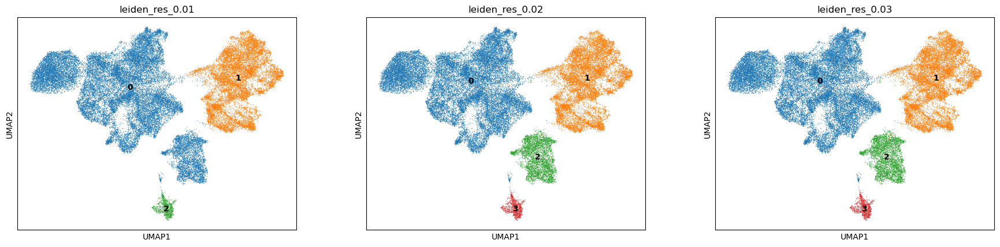

In [309]:
sc.pl.umap(
    onh_vascendo,
    color=["leiden_res_0.01", "leiden_res_0.02", "leiden_res_0.03"],
    legend_loc="on data",
)

In [316]:
### Vasc endo markers subtypes
marker_genes_dict = {
    "General endothelial Cells": ["PECAM1", "LYVE1", "CDH5", "VWF"],
    "Endo progenitor Cells": ["CD34", "KIT", "ETV2", "PROM1"],
    "Activated endo cells": ["SELE", "IL6", "VCAM1", "ICAM1"],
    "Vasc endo": ["SOX4", "KDR", "FLT1", "DBI", "LPL", "EGR1", "JUNB", "CD44", "CLDN5"],
    "Vasc endo HGV": ["HES4", "ISG15", "PRDM16", "ERRFI1", "SPSB1"],
    
}

categories: 0, 1, 2, etc.
var_group_labels: General endothelial Cells, Endo progenitor Cells, Activated endo cells, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


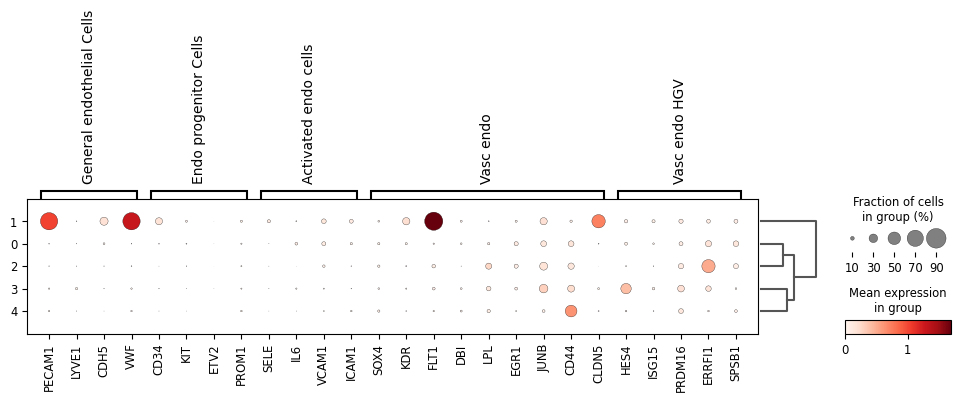

In [317]:
sc.pl.dotplot(onh_vascendo, marker_genes_dict, "leiden_res_0.05", dendrogram=True)

In [318]:
onh_vascendo.obs["cell_type"] = onh_vascendo.obs["leiden_res_0.02"].map(
    {
        "0": "VascEndo JUNB+",
        "1": "VascEndo FLT1+",
        "2": "VascEndo ERRFI1+",
        "3": "VascEndo HES4+",
        "4": "VascEndo CD44+",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


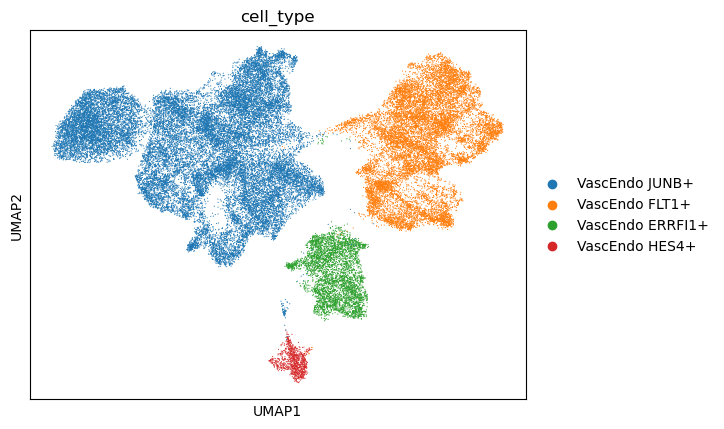

In [319]:
sc.pl.umap(onh_vascendo, color = "cell_type")

In [320]:
sc.write('onh_vascendocells.h5ad', onh_vascendo)

In [321]:
## Try to integrate the new h5ad files using this tutorial https://nbisweden.github.io/workshop-archive/workshop-scRNAseq/2020-01-27/labs/compiled/scanpy/scanpy_03_integration.html

AnnData object with n_obs × n_vars = 46755 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'gender', 'age', 'ethnicity', 'sampleid', 'leiden', 'group', 'annotate', 'leiden_res_0.04', 'leiden_res_0.05', 'leiden_res_0.10', 'leiden_res_0.01', 'leiden_res_0.02', 'leiden_res_0.03', 'cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'annotate_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_res_0.04_colors', 'leiden_res_0.05_colors', 'leiden_res_0.10_colors', 'dendrogram_leiden_res_0.05', 'leiden_res_0.01_colors', 'leiden_res_0.02_colors', 'leiden_res_0.03_colors', 'cell_type_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
########################################################
############# Optic nerve reclustering - ON ############
########################################################

In [322]:
on = sc.read_h5ad("/Users/cristalvillalba/Downloads/opticnerve/opticnerveall/on_new.h5ad")

In [323]:
on

AnnData object with n_obs × n_vars = 541761 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'age', 'gender', 'ethnicity', 'sampleid', 'leiden', 'annotate', 'group'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


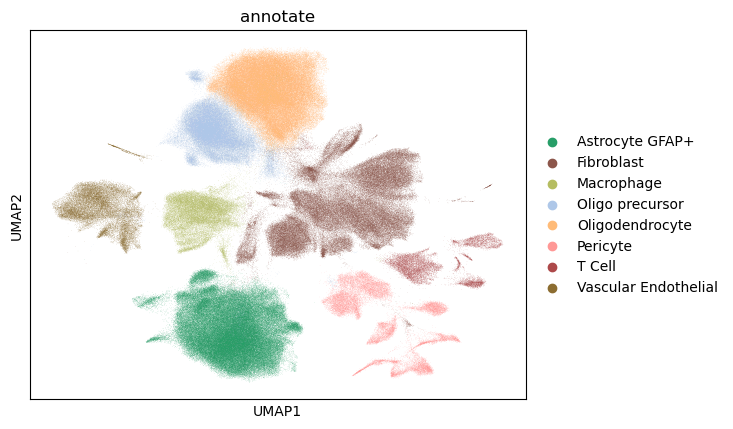

In [324]:
sc.pl.umap(on, color = "annotate")

In [329]:
on_astro=on[~on.obs['annotate'].isin(['Fibroblast','Macrophage', 'Oligo precursor', 'Oligodendrocyte', 'Pericyte', 'T Cell','Vascular Endothelial'])]

In [330]:
on_astro

View of AnnData object with n_obs × n_vars = 144656 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'age', 'gender', 'ethnicity', 'sampleid', 'leiden', 'annotate', 'group'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


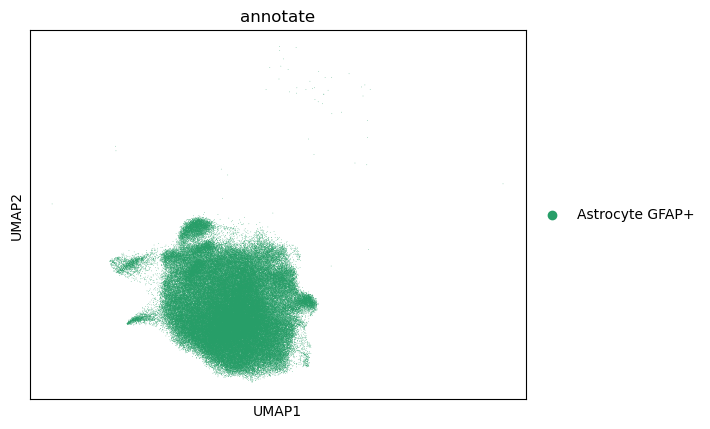

In [331]:
sc.pl.umap(on_astro, color = "annotate")

In [357]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(on_astro)
# Logarithmize the data
sc.pp.log1p(on_astro)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [358]:
sc.pp.highly_variable_genes(on_astro, n_top_genes=2000, batch_key="sampleid")

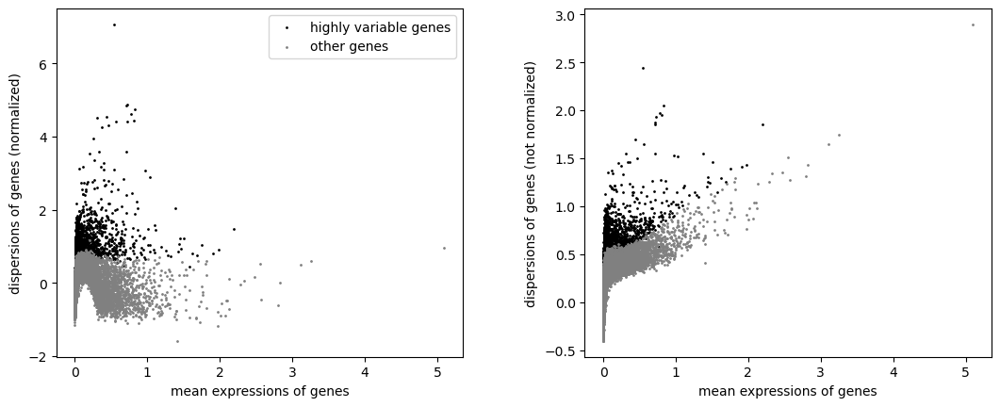

In [359]:
sc.pl.highly_variable_genes(on_astro)

In [360]:
sc.tl.pca(on_astro)

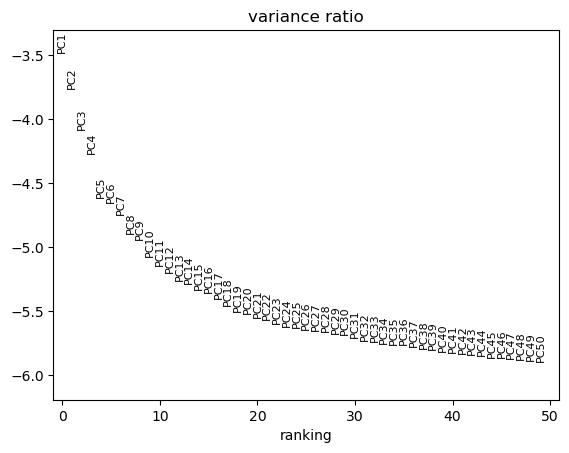

In [361]:
sc.pl.pca_variance_ratio(on_astro, n_pcs=50, log=True)

In [362]:
sc.pp.neighbors(on_astro)

In [363]:
sc.tl.umap(on_astro)

In [370]:
for res in [0.2, 0.3, 0.5]:
    sc.tl.leiden(
        on_astro, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


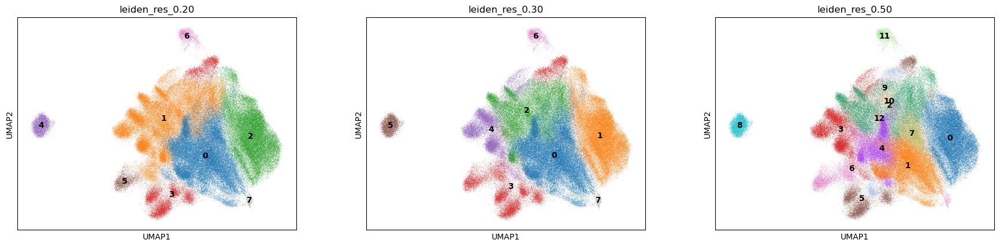

In [371]:
sc.pl.umap(
    on_astro,
    color=["leiden_res_0.20", "leiden_res_0.30", "leiden_res_0.50"],
    legend_loc="on data",
)

In [374]:
#### Identification of clusters based on known marker genes for astrocytes
 
marker_genes_dict = {
    "Astrocyte GFAP+": ["GFAP", "SOX9", "DIO2", "SLCO1C1"],
    "General Astrocytes": ["ABHD5", "ALDH1L1", "CPT1A", "CPT2", "GPT2", "PC"],
    "Mature astrocytes": ["CNN1", "GJB6", "ITGA6", "PDLIM7", "SYNPO2"],
    "Astrocytes endfeet": ["APOE", "AQP4","GJA1"],
    "Fine Astrocyte Processes": ["EZR", "RDX", "SLC1A2", "SLC1A3"],
    "Immature astrocytes": ["THBS1", "SYNM", "NES", "ITGB5", "SYNM", "THBS1", "VIM"],
}

categories: 0, 1, 2, etc.
var_group_labels: Astrocyte GFAP+, General Astrocytes, Mature astrocytes, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


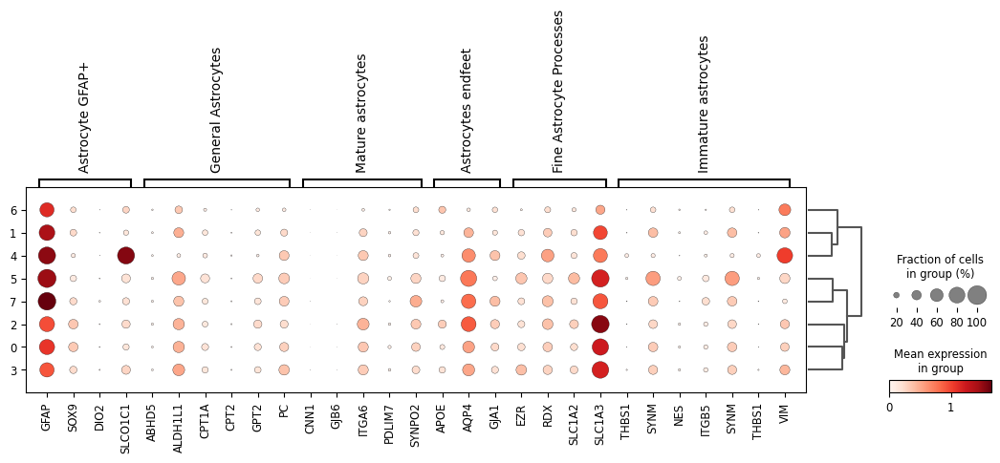

In [375]:
sc.pl.dotplot(on_astro, marker_genes_dict, "leiden_res_0.20", dendrogram=True)

In [382]:
on_astro.obs["cell_type"] = on_astro.obs["leiden_res_0.20"].map(
    {
        "0": "Astrocyte GFAP+",
        "1": "Astrocyte GFAP+",
        "2": "Mature Astrocytes",
        "3": "Mature Astrocytes",
        "4": "Immature astrocytes",
        "5": "Astrocytes endfeet",
        "6": "Immature astrocytes",
        "7": "Astrocyte GFAP+",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


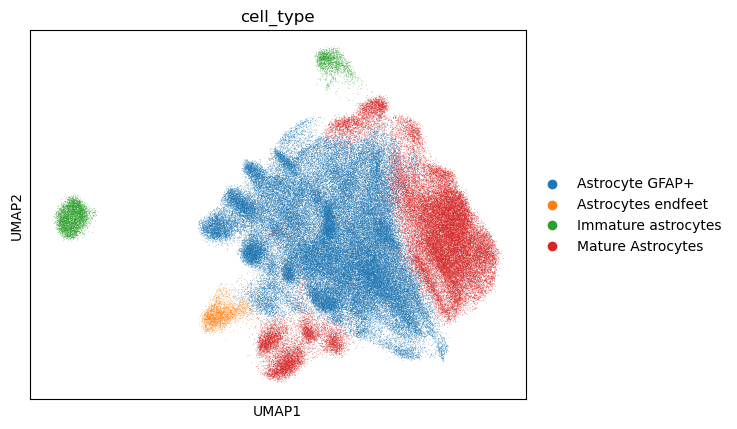

In [383]:
sc.pl.umap(on_astro, color=["cell_type"])

In [384]:
sc.write('on_astrocytes.h5ad', on_astro)

In [ ]:
### ON Fibroblasts

In [385]:
on_fibro=on[~on.obs['annotate'].isin(['Astrocyte GFAP+','Macrophage', 'Oligo precursor', 'Oligodendrocyte', 'Pericyte', 'T Cell','Vascular Endothelial'])]

In [386]:
on_fibro

View of AnnData object with n_obs × n_vars = 112552 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'age', 'gender', 'ethnicity', 'sampleid', 'leiden', 'annotate', 'group'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


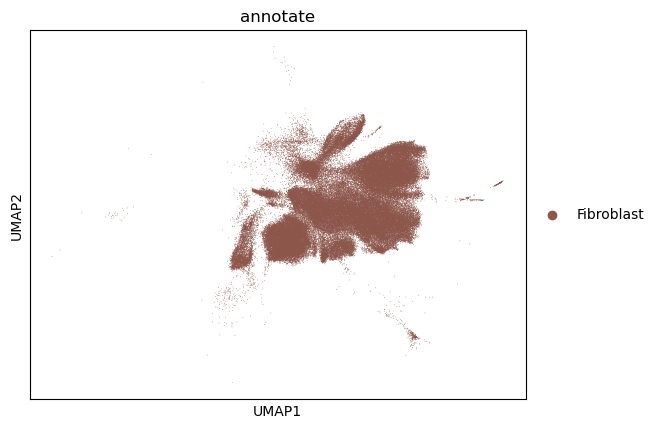

In [387]:
sc.pl.umap(on_fibro, color = "annotate")

In [388]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(on_fibro)
# Logarithmize the data
sc.pp.log1p(on_fibro)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [389]:
sc.pp.highly_variable_genes(on_fibro, n_top_genes=2000, batch_key="sampleid")

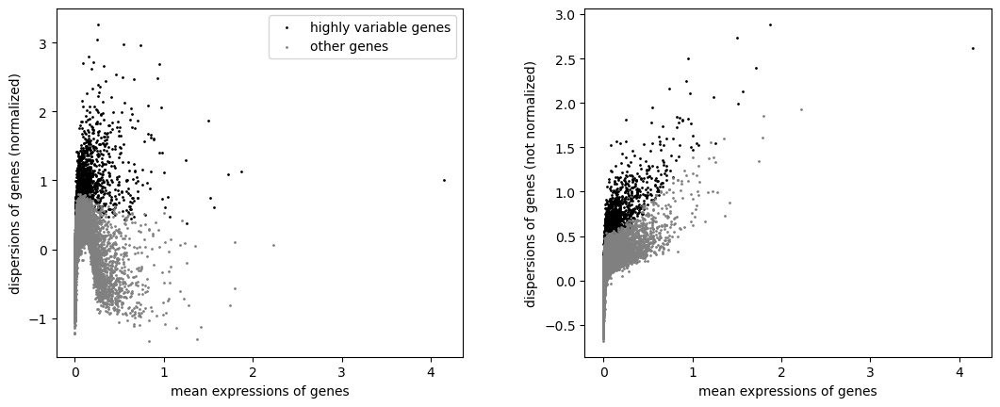

In [390]:
sc.pl.highly_variable_genes(on_fibro)

In [391]:
sc.tl.pca(on_fibro)

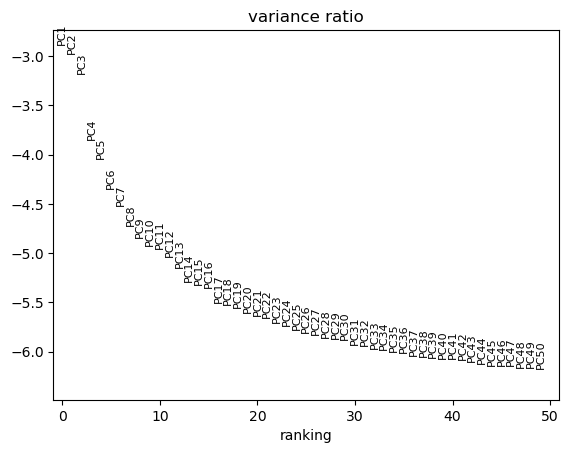

In [392]:
sc.pl.pca_variance_ratio(on_fibro, n_pcs=50, log=True)

In [393]:
sc.pp.neighbors(on_fibro)

In [394]:
sc.tl.umap(on_fibro)

In [415]:
for res in [0.02, 0.03, 0.05]:
    sc.tl.leiden(
        on_fibro, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


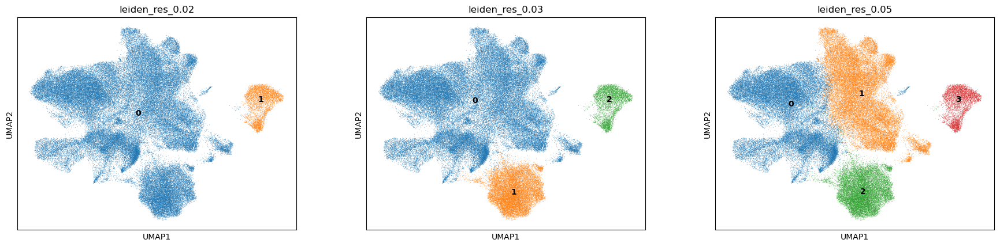

In [416]:
sc.pl.umap(
    on_fibro,
    color=["leiden_res_0.02", "leiden_res_0.03", "leiden_res_0.05"],
    legend_loc="on data",
)

In [417]:
### Markers for fibroblasts
marker_genes_dict = {
    "Fibro DCN": ["DCN"],
    "Fibro MGP": ["MGP"],
    "Secretory": ["CCN5", "SLPI", "MFAP5", "TSPAN8", "ID1", "WIF1"],
    "Myofibroblast": ["TNC", "ACTA2","TAGLN"],
    "General fibroblast": ["VIM", "PDGFRA", "FAP", "AIFM2"],
    "Mesenchymal": ["ASPN", "POSTN", "GPC3", "TNN", "SFRP1"], 
    "Pro inflammatory fibro": ["CCL19", "APOE", "CXCL2", "CXCL3", "EFEMP1"],
    "Activated fibro": ["ACTA1", "AIFM2", "IL6", "TNF", "TGFB1", "CD36", "VEGFA", "HGF"],
    "Proliferative fibroblasts": ["SAMD11", "VWA1", "PRDM16", "CHD5", "ERRFI1"],
}

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


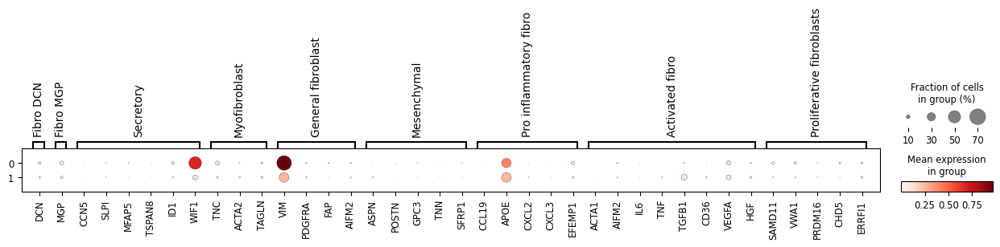

In [419]:
sc.pl.dotplot(onh_fibro, marker_genes_dict, "leiden_res_0.03", dendrogram=True)

In [420]:
on_fibro.obs["cell_type"] = on_fibro.obs["leiden_res_0.04"].map(
    {
        "0": "Fibroblast VIM+",
        "1": "Fibroblast APOE+",
        "2": "Fibroblast",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


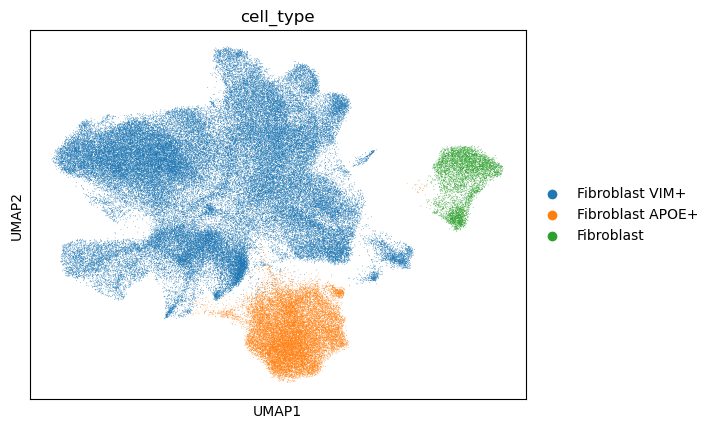

In [421]:
sc.pl.umap(on_fibro, color=["cell_type"])

In [423]:
sc.write('on_fibroblasts.h5ad', on_fibro)

In [ ]:
### ON Macrophage

In [424]:
on_macro=on[~on.obs['annotate'].isin(['Astrocyte GFAP+','Fibroblast', 'Oligo precursor', 'Oligodendrocyte', 'Pericyte', 'T Cell','Vascular Endothelial'])]

In [425]:
on_macro

View of AnnData object with n_obs × n_vars = 30880 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'age', 'gender', 'ethnicity', 'sampleid', 'leiden', 'annotate', 'group'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


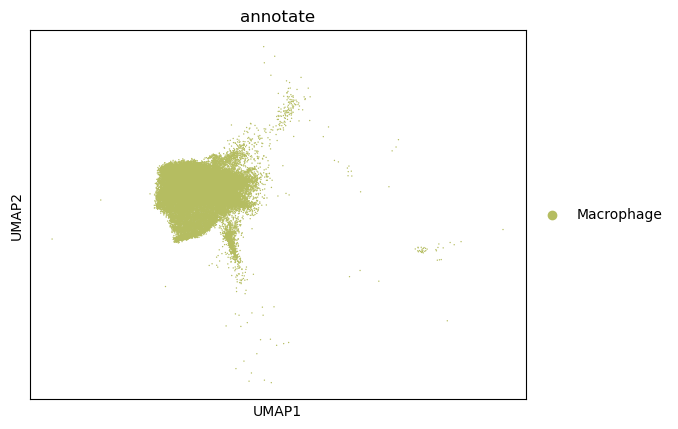

In [426]:
sc.pl.umap(on_macro, color = "annotate")

In [427]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(on_macro)
# Logarithmize the data
sc.pp.log1p(on_macro)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [428]:
sc.pp.highly_variable_genes(on_macro, n_top_genes=2000, batch_key="sampleid")

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:247: RuntimeWarning: divide by zero encountered in divide
  df["dispersions_norm"] = (
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:247: RuntimeWarning: invalid value encountered in divide
  df["dispersions_norm"] = (
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:279: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(


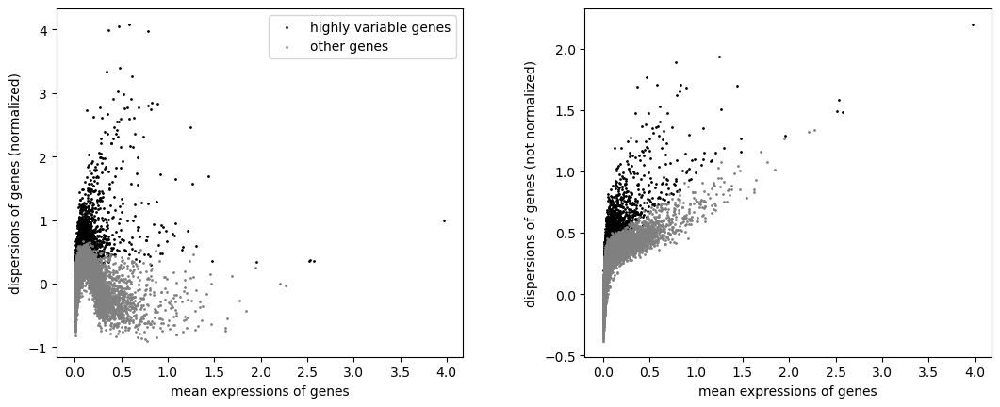

In [429]:
sc.pl.highly_variable_genes(on_macro)

In [430]:
sc.tl.pca(on_macro)

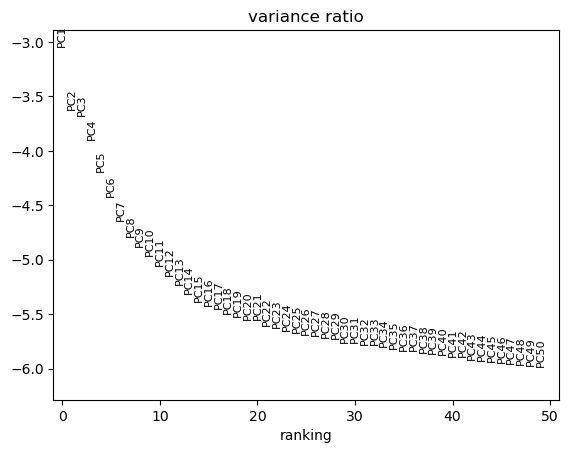

In [431]:
sc.pl.pca_variance_ratio(on_macro, n_pcs=50, log=True)

In [432]:
sc.pp.neighbors(on_macro)

In [433]:
sc.tl.umap(on_macro)

In [444]:
for res in [0.05, 0.06, 0.08]:
    sc.tl.leiden(
        on_macro, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


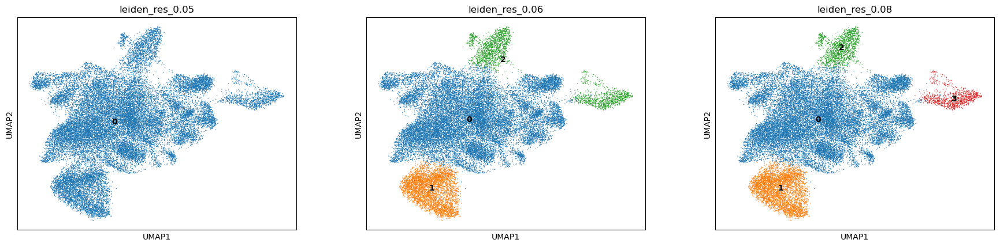

In [445]:
sc.pl.umap(
    on_macro,
    color=["leiden_res_0.05", "leiden_res_0.06", "leiden_res_0.08"],
    legend_loc="on data",
)

In [446]:
###Microglia are possible to be on macrophage clusters due to molecular profile
marker_genes_dict = {
    "Resting microglia": ["TMEM119", "P2RY12", "CX3CR1", "TREM2", "SALL1", "C1QA"],
    "Activated microglia": ["FCRL3", "FCRLA", "TNF", "IL1B", "NOS2", "MMP9", "NLRP3", "S100A8", "S100A9"],
    "Microglia": ["C1QA", "P2RY12", "CD74", "CSF1R", "AIF1", "CX3CR1", "TMEM119"],
    "Perivascular macrophage": ["CD163", "MRC1"],
    "Monocyte-derived": ["NOS2", "CD86", "ARG1", "MRC1"],
    "Resident macrophages": ["ADGRE1", "CSF1R", "TNF"],
    "Microglia": ["C1QA", "P2RY12", "CD74", "CSF1R", "AIF1", "CX3CR1", "TMEM119"],
    "Macrophage": ["CD14", "FCGR3A", "FCGR1A", "CD68", "TFRC", "CCR5"],
}

categories: 0, 1, 2, etc.
var_group_labels: Resting microglia, Activated microglia, Microglia, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


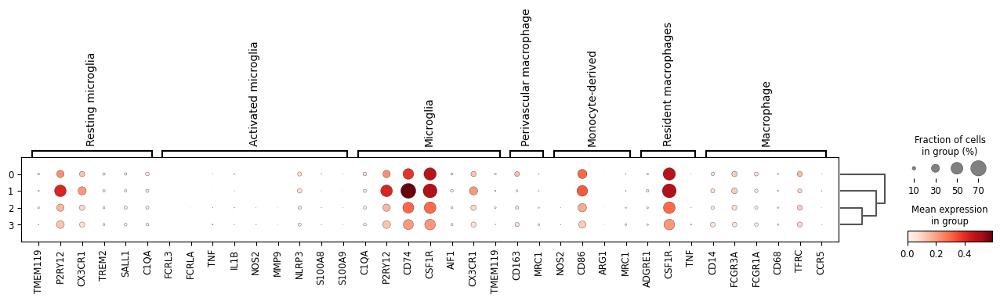

In [449]:
sc.pl.dotplot(on_macro, marker_genes_dict, "leiden_res_0.08", dendrogram=True)

In [454]:
on_macro.obs["cell_type"] = on_macro.obs["leiden_res_0.10"].map(
    {
        "0": "Microglia",
        "1": "Microglia",
        "2": "Macrophage",
        "3": "Macrophage",
        "4": "Macrophage",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


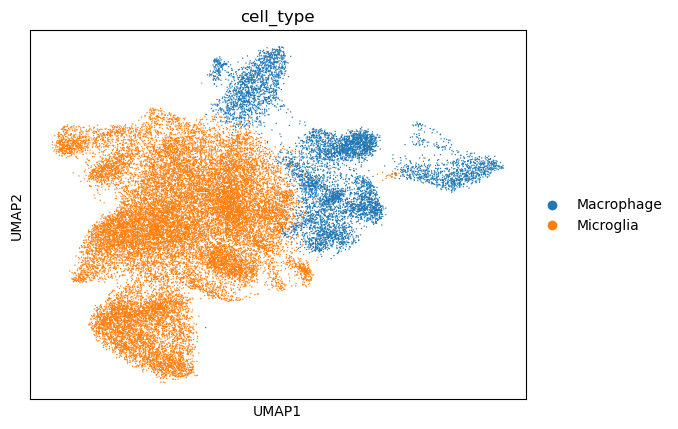

In [455]:
sc.pl.umap(on_macro, color=["cell_type"])

In [456]:
sc.write('on_macrophages.h5ad', on_macro)

In [ ]:
## OPC and OLIGO

In [457]:
on_oligo=on[~on.obs['annotate'].isin(['Astrocyte GFAP+','Fibroblast', 'Macrophage', 'Pericyte', 'T Cell','Vascular Endothelial'])]

In [458]:
on_oligo

View of AnnData object with n_obs × n_vars = 187728 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'age', 'gender', 'ethnicity', 'sampleid', 'leiden', 'annotate', 'group'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


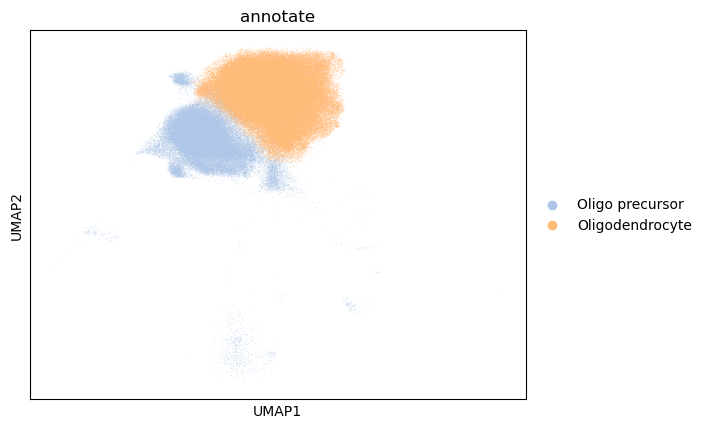

In [459]:
sc.pl.umap(on_oligo, color=["annotate"])

In [460]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(on_oligo)
# Logarithmize the data
sc.pp.log1p(on_oligo)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [461]:
sc.pp.highly_variable_genes(on_oligo, n_top_genes=2000, batch_key="sampleid")

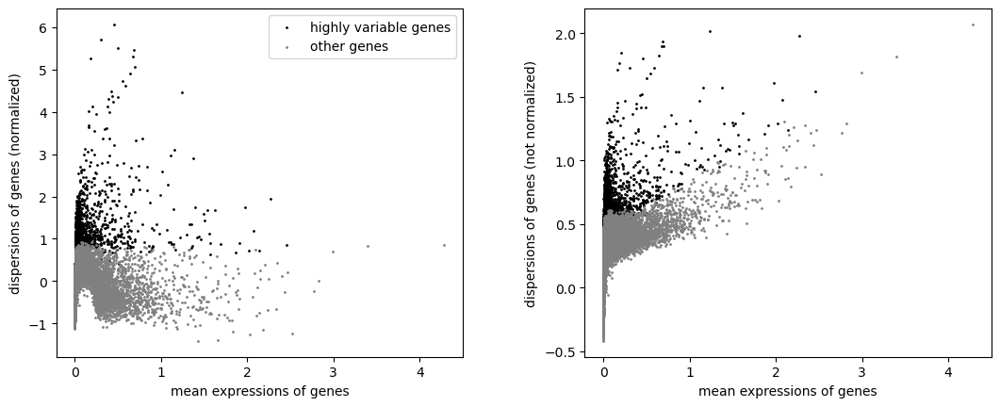

In [462]:
sc.pl.highly_variable_genes(on_oligo)

In [463]:
sc.tl.pca(on_oligo)

In [464]:
sc.pp.neighbors(on_oligo)

In [465]:
sc.tl.umap(on_oligo)

In [468]:
for res in [0.08, 0.2, 0.5]:
    sc.tl.leiden(
        on_oligo, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


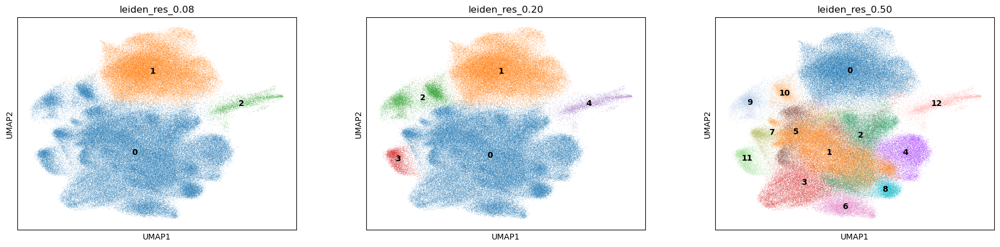

In [469]:
sc.pl.umap(
    on_oligo,
    color=["leiden_res_0.08", "leiden_res_0.20", "leiden_res_0.50"],
    legend_loc="on data",
)

In [473]:
###Oligodendrocyte subtypes Committed Oligodendrocyte Precursors -cpc
marker_genes_dict = {
    "OPC": ["PDGFRA", "CSPG4", "CD9", "GPR17", "OLIG2"],
    "CPC": ["SOX10", "PDGFRA", "OLIG1"],
    "Immature oligo": ["MOG", "NKX2-2"],
    "Mature oligo": ["MBP", "MAG", "PLP1"],
    "Myelinating oligo": ["OPALIN", "MBP", "MYRF"],
    "Oligo MBP+": ["MBP"],
}

categories: 0, 1, 2, etc.
var_group_labels: OPC, CPC, Immature oligo, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


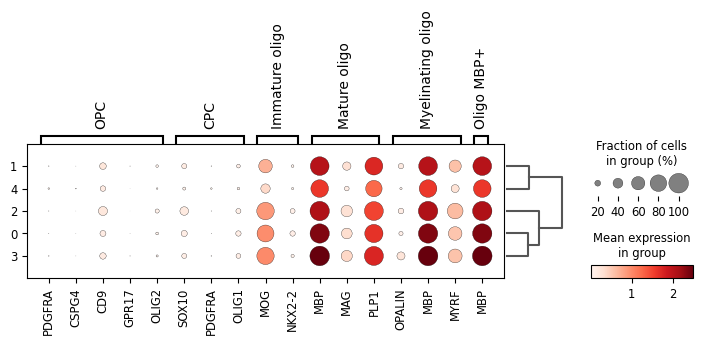

In [474]:
sc.pl.dotplot(on_oligo, marker_genes_dict, "leiden_res_0.20", dendrogram=True)

In [475]:
on_oligo.obs["cell_type"] = on_oligo.obs["leiden_res_0.20"].map(
    {
        "0": "Oligodendrocyte MBP+",
        "1": "Oligodendrocyte",
        "2": "Oligodendrocyte",
        "3": "Oligodendrocyte MBP+",
        "4": "Oligodendrocyte",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


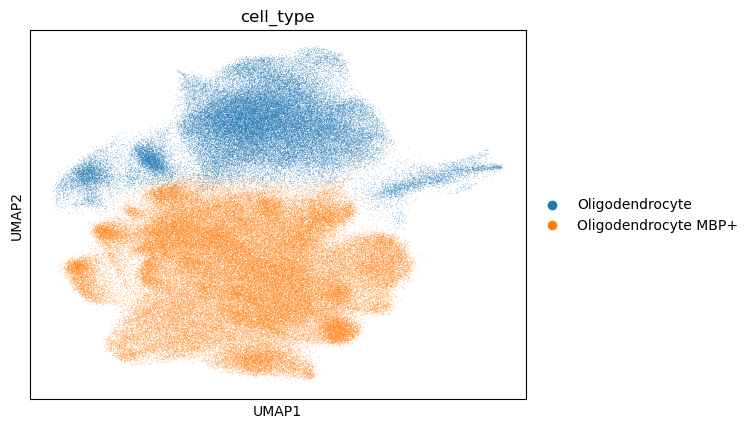

In [476]:
sc.pl.umap(on_oligo, color=["cell_type"])

In [477]:
sc.write('on_oligodendrocytes.h5ad', on_oligo)

In [ ]:
## ON T Cell

In [478]:
on_tcell=on[~on.obs['annotate'].isin(['Astrocyte GFAP+','Fibroblast', 'Oligo precursor', 'Oligodendrocyte', 'Pericyte', 'Macrophage','Vascular Endothelial'])]

In [479]:
on_tcell

View of AnnData object with n_obs × n_vars = 13163 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'age', 'gender', 'ethnicity', 'sampleid', 'leiden', 'annotate', 'group'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


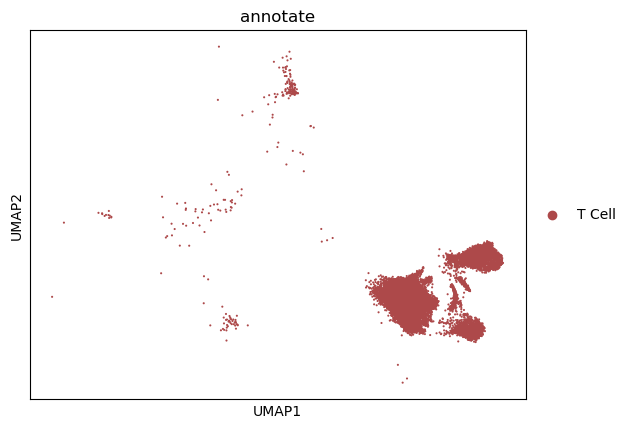

In [480]:
sc.pl.umap(on_tcell, color=["annotate"])

In [481]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(on_tcell)
# Logarithmize the data
sc.pp.log1p(on_tcell)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [482]:
sc.pp.highly_variable_genes(on_tcell, n_top_genes=2000, batch_key="sampleid")

In [483]:
sc.tl.pca(on_tcell)

In [484]:
sc.pp.neighbors(on_tcell)

In [485]:
sc.tl.umap(on_oligo)

In [486]:
for res in [0.02, 0.04, 0.10]:
    sc.tl.leiden(
        on_tcell, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


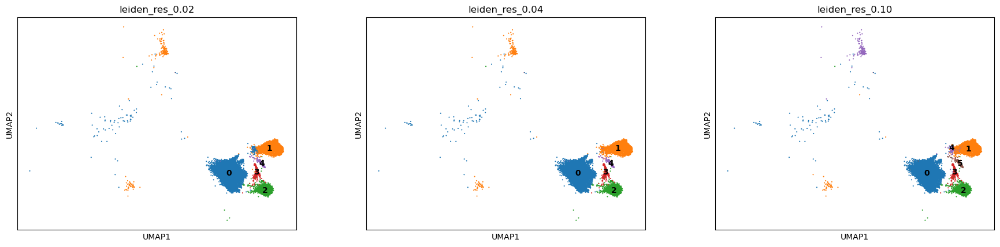

In [487]:
sc.pl.umap(
    on_tcell,
    color=["leiden_res_0.02", "leiden_res_0.04", "leiden_res_0.10"],
    legend_loc="on data",
)

In [488]:
### T cell markers subtypes
marker_genes_dict = {
    "CD4+ T Helper (Th) Cells": ["CD4", "IFNG", "TBX21", "CXCR3", "IL4", "GATA3", "RORC"],
    "T Regulatory (Treg) Cells": ["FOXP3", "IL2RA", "CTLA4"],
    "Lymphocytes": ["CD8A", "GZMB", "PRF1"],
    "Effector Memory T Cells (Tem)": ["CX3CR1", "GZMK"],
    "Natural Killer T (NKT) Cells": ["TRAV10", "NCAM1", "ZBTB16"],
    
}

categories: 0, 1, 2, etc.
var_group_labels: CD4+ T Helper (Th) Cells, T Regulatory (Treg) Cells, Lymphocytes, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


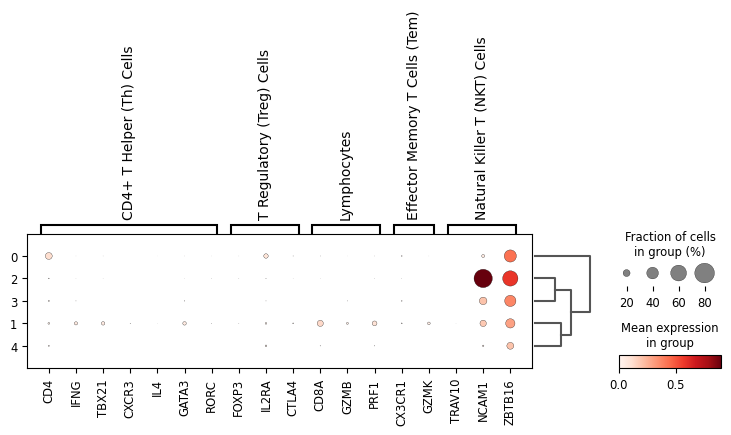

In [489]:
sc.pl.dotplot(on_tcell, marker_genes_dict, "leiden_res_0.02", dendrogram=True)

In [492]:
on_tcell.obs["cell_type"] = on_tcell.obs["leiden_res_0.02"].map(
    {
        "0": "Natural Killer T (NKT) Cells",
        "1": "Lymphocytes",
        "2": "Natural Killer T (NKT) Cells",
        "3": "Natural Killer T (NKT) Cells",
        "4": "Lymphocytes",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


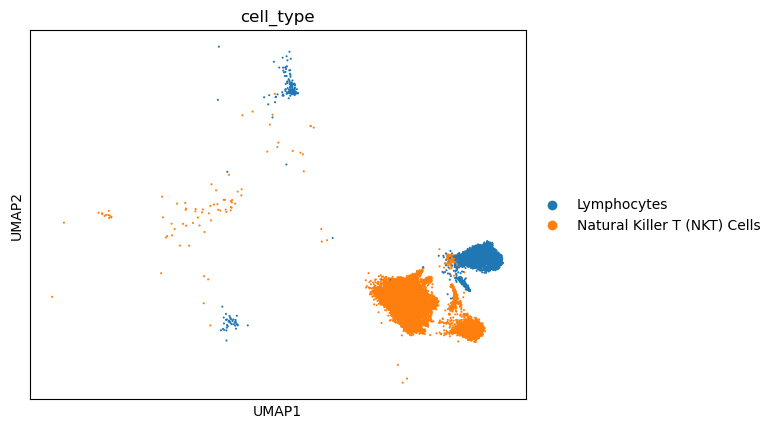

In [493]:
sc.pl.umap(on_tcell, color=["cell_type"])

In [494]:
sc.write('on_tcells.h5ad', on_tcell)

In [ ]:
## Vasc endo ON

In [498]:
on_vasco=on[~on.obs['annotate'].isin(['Astrocyte GFAP+','Fibroblast', 'Oligo precursor', 'Oligodendrocyte', 'Pericyte', 'Macrophage','T Cell'])]

In [499]:
on_vasco

View of AnnData object with n_obs × n_vars = 26112 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'pANN', 'DF.classifications', 'donor', 'age', 'gender', 'ethnicity', 'sampleid', 'leiden', 'annotate', 'group'
    uns: 'annotate_colors'
    obsm: 'X_scVI', 'X_umap'

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


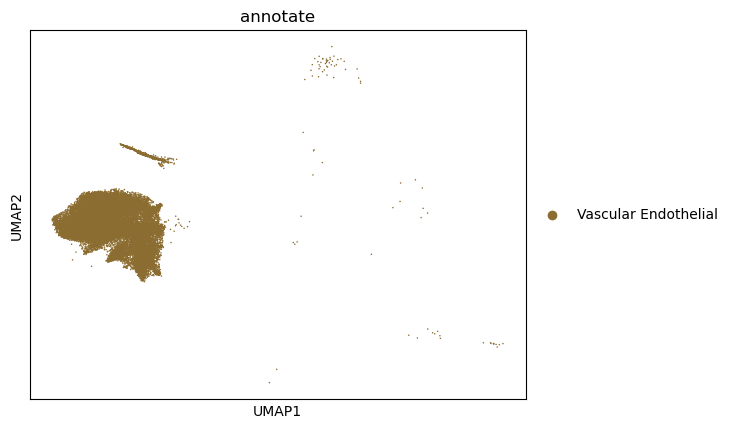

In [500]:
sc.pl.umap(on_vasco, color=["annotate"])

In [501]:
#Redo clustering 
# Normalizing to median total counts
sc.pp.normalize_total(on_vasco)
# Logarithmize the data
sc.pp.log1p(on_vasco)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [502]:
sc.pp.highly_variable_genes(on_vasco, n_top_genes=2000, batch_key="sampleid")

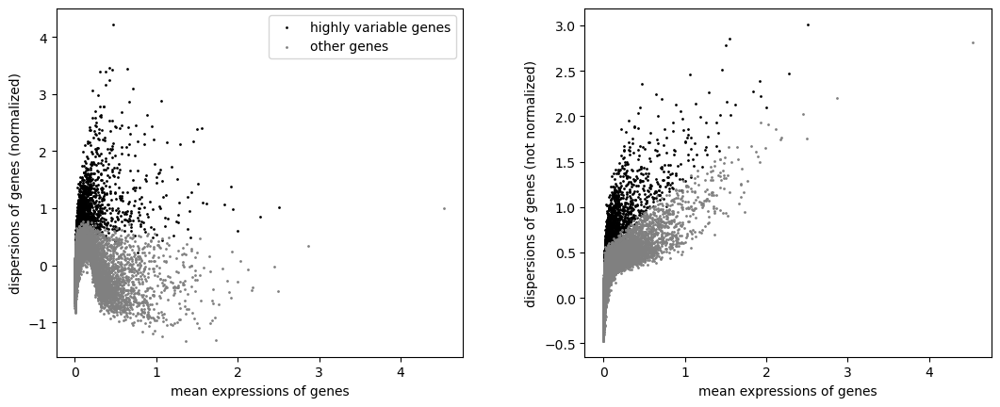

In [503]:
sc.pl.highly_variable_genes(on_vasco)

In [504]:
sc.tl.pca(on_vasco)

In [505]:
sc.pp.neighbors(on_vasco)

In [506]:
sc.tl.umap(on_vasco)

In [509]:
for res in [0.08, 0.2, 0.5]:
    sc.tl.leiden(
        on_vasco, key_added=f"leiden_res_{res:4.2f}", resolution=res)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


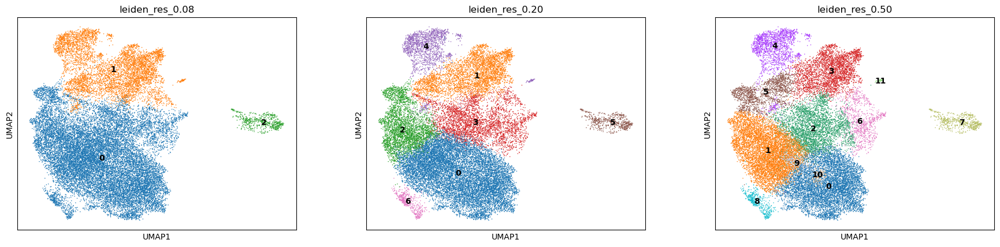

In [510]:
sc.pl.umap(
    on_vasco,
    color=["leiden_res_0.08", "leiden_res_0.20", "leiden_res_0.50"],
    legend_loc="on data",
)

In [511]:
### Vasc endo markers subtypes
marker_genes_dict = {
    "General endothelial Cells": ["PECAM1", "LYVE1", "CDH5", "VWF"],
    "Endo progenitor Cells": ["CD34", "KIT", "ETV2", "PROM1"],
    "Activated endo cells": ["SELE", "IL6", "VCAM1", "ICAM1"],
    "Vasc endo": ["SOX4", "KDR", "FLT1", "DBI", "LPL", "EGR1", "JUNB", "CD44", "CLDN5"],
    "Vasc endo HGV": ["HES4", "ISG15", "PRDM16", "ERRFI1", "SPSB1"],
    
}

categories: 0, 1, 2, etc.
var_group_labels: General endothelial Cells, Endo progenitor Cells, Activated endo cells, etc.


/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


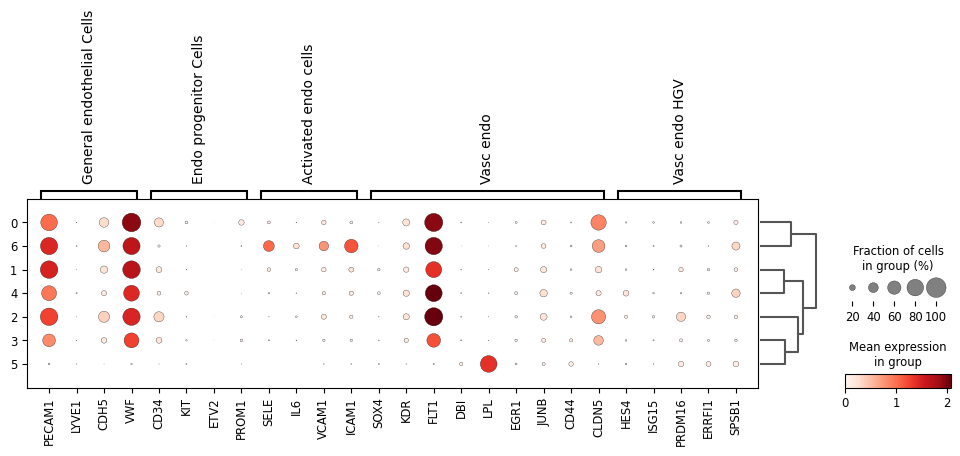

In [512]:
sc.pl.dotplot(on_vasco, marker_genes_dict, "leiden_res_0.20", dendrogram=True)

In [513]:
on_vasco.obs["cell_type"] = on_vasco.obs["leiden_res_0.20"].map(
    {
        "0": "Vasc Endo FLT1+VWF+",
        "1": "Vasc Endo PECAM1+VWF+",
        "2": "Vasc Endo FLT1+",
        "3": "Vasc Endo VWF+",
        "4": "Vasc Endo FLT1+",
        "5": "Vasc Endo LPL+",
        "6": "Vasc Endo FLT1+",
    }
)

/Users/cristalvillalba/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


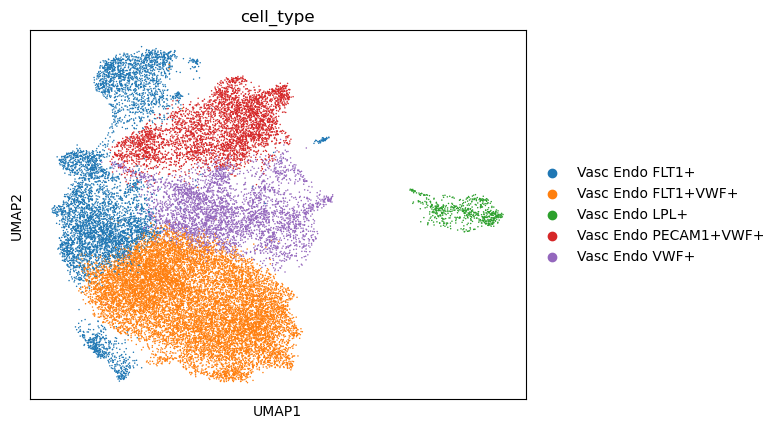

In [514]:
sc.pl.umap(on_vasco, color=["cell_type"])

In [515]:
sc.write('on_vascendocells.h5ad', on_vasco)

In [ ]:
#MERGE ALL PARTS

In [ ]:
Run1 = sc.read_h5ad('xxx.h5ad')
Run2 = sc.read_h5ad('xxx.h5ad')
Run3 = sc.read_h5ad('xxx.h5ad')
merged = Run1.concatenate(Run2,Run3)
merged.layers['counts']=merged.X.copy()
merged.var_names_make_unique()